In [157]:
"""
    Importeer libraries
    """
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree
from math import sqrt, ceil
from scipy.stats import linregress    
import libraries as lib
import math 
    

In [158]:
# Set Lees GPS data met hoogte-data in
"""
    Maak dataframe  met hoogte data.

    Parameters:
        file_path: directory van het bestand met hoogteprofiel

    Returns:
        DataFrame: Het dataframe met hoogte data.
    """

file_path = "/Users/willemheemskerk/Downloads/20230525_h2a_poging1/0002/Data voor hoogteprofiel.txt"

# Read GPS data
hoogte_df = lib.lees_gps_data(file_path)

# Print the resulting DataFrame
hoogte_df


,timestamp,latitude,lat_direction,longitude,lon_direction,hoogte,speed_m/s
0,063448.30,43.771393,N,-0.042098,W,99.5,0.038583
1,063448.40,43.771393,N,-0.042098,W,99.5,0.026237
2,063448.50,43.771393,N,-0.042098,W,99.4,0.035497
3,063448.60,43.771393,N,-0.042098,W,99.5,0.073051
4,063448.70,43.771393,N,-0.042098,W,99.4,0.064820
...,...,...,...,...,...,...,...
46568,None,43.771202,N,-0.041941,W,96.0,NaN
46569,None,43.771202,N,-0.041941,W,96.0,NaN
46570,None,43.771202,N,-0.041941,W,96.1,NaN
46571,None,43.771202,N,-0.041941,W,96.1,NaN


In [159]:
#Filter vanaf het moment dat de auto de baan opgaat en wanneer die er weer afgaat.
"""
    Filter de data handmatig vanaf een opgegeven startrij tot een opgegeven eindrij.

    Parameters:
        data_file_motordriver (DataFrame): Het originele DataFrame.
        start_row (int): Het indexnummer van de rij waarmee het filteren moet beginnen.
        end_row (int): Het indexnummer van de rij waarmee het filteren moet eindigen.

    Returns:
        DataFrame: Het gefilterde DataFrame vanaf start_row tot end_row.
    """
# Definieer de coördinaten voor het start- en eindpunt
start_lon = -0.0446
start_lat = 0.00095 + 4.3771e1
end_lon = -0.039925
end_lat = 0.000300 + 4.3771e1

# Veronderstel dat 'df' je DataFrame is met de relevante data
filtered_hoogte_df = lib.filter_track_data(hoogte_df, start_lon, start_lat, end_lon, end_lat)

# Print het gefilterde DataFrame om te controleren
filtered_hoogte_df
#43.767914, -0.035855

,timestamp,latitude,lat_direction,longitude,lon_direction,hoogte,speed_m/s
22340,071203.60,43.771951,N,-0.044597,W,102.0,5.597156
22341,071203.70,43.771954,N,-0.044603,W,102.0,5.624421
22342,071203.80,43.771955,N,-0.044609,W,102.0,5.633167
22343,071203.90,43.771958,N,-0.044616,W,102.0,5.650143
22344,071204.00,43.771960,N,-0.044622,W,102.0,5.655288
...,...,...,...,...,...,...,...
42943,074720.40,43.771037,N,-0.040149,W,98.1,8.270209
42944,074720.50,43.771032,N,-0.040142,W,98.1,8.298503
42945,074720.60,43.771027,N,-0.040135,W,98.1,8.276382
42946,074720.70,43.771022,N,-0.040127,W,98.1,8.287700


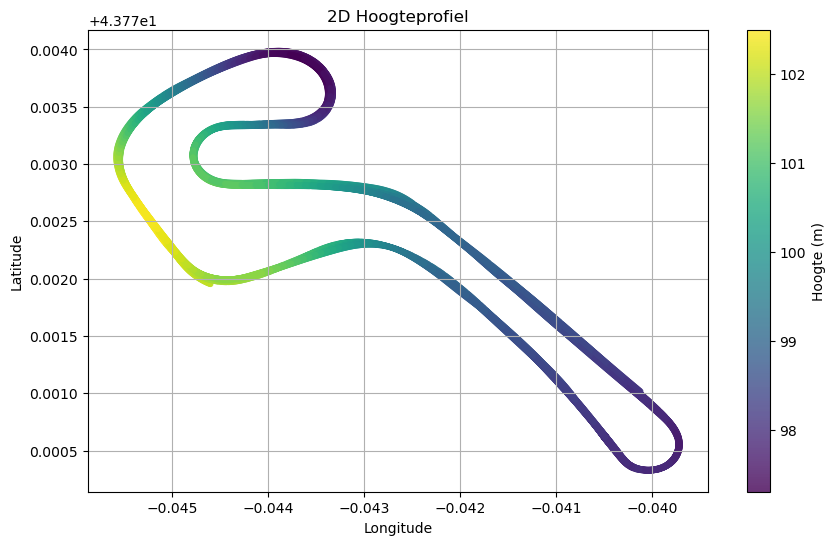

In [160]:
# Maak hoogteprofiel van de baan
"""
    Visualiseert het hoogteprofiel van de racebaan.

    Parameters:
    latitudes (pd.Series of list): Lijst of Pandas Series met breedtegraden van de meetpunten.
    longitudes (pd.Series of list): Lijst of Pandas Series met lengtegraden van de meetpunten.
    hoogtes (pd.Series of list): Lijst of Pandas Series met hoogtes boven zeeniveau van de meetpunten.

    Returns:
    None
    """
lib.plot_height_profile(filtered_hoogte_df['latitude'], filtered_hoogte_df['longitude'], filtered_hoogte_df['hoogte'])


Indices van punten in de twee gebieden: [962, 1282, 3058, 3356, 5066, 5370, 7068, 7372, 9238, 9561, 11378, 11698, 13580, 13908, 15782, 16107, 18039, 18370, 20317]


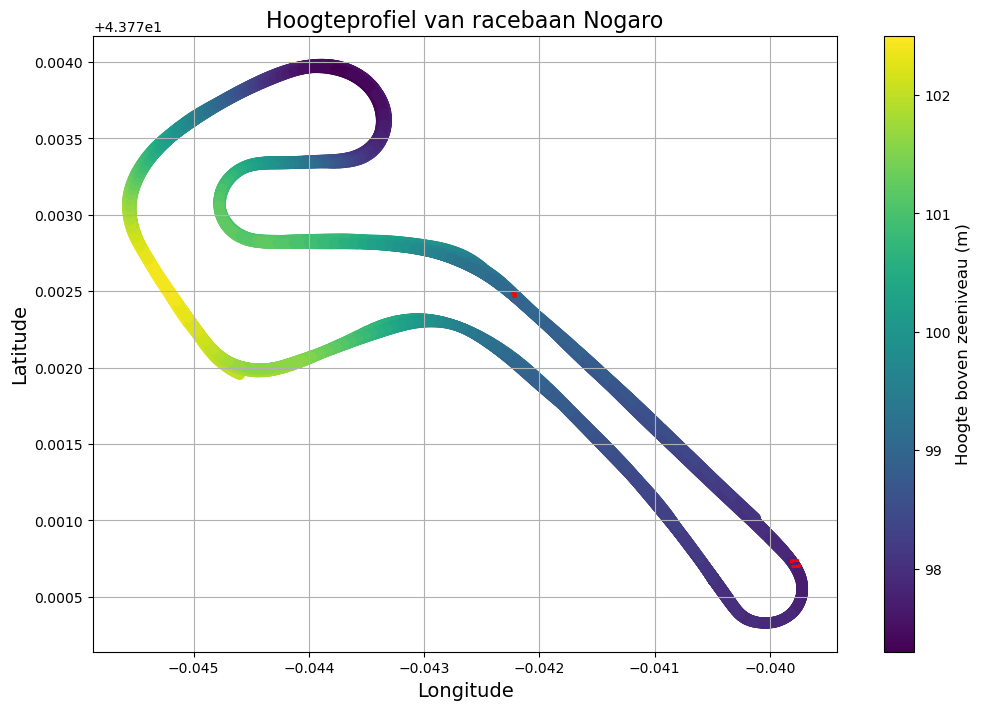

In [161]:
#Zoekt de rijen van stukken die je wilt definiëren, eerste index is begin, 2e index is eind.
"""
    Identificeert de indices van rijen in de DataFrame die binnen twee opgegeven rechthoekige gebieden vallen.

    Parameters:
    df (DataFrame): De DataFrame met 'latitude' en 'longitude' kolommen.
    lat_min1, lat_max1, lon_min1, lon_max1: Coördinaten van het eerste gebied.
    lat_min2, lat_max2, lon_min2, lon_max2: Coördinaten van het tweede gebied.

    Returns:
    list: Lijst met indices van de rijen die binnen de opgegeven gebieden vallen.
    """
lat_min1, lat_max1 = 7e-5 + 4.37724e1, 8.6e-5 + 4.37724e1
lon_min1, lon_max1 = -0.04224, -0.04221

lat_min2, lat_max2 = 70e-5 + 4.377e1, 74e-5 + 4.377e1
lon_min2, lon_max2 = -0.03982, -0.03975

indices = lib.vind_rijen(
    filtered_hoogte_df,
    lat_min1, lat_max1, lon_min1, lon_max1,
    lat_min2, lat_max2, lon_min2, lon_max2
)
print("Indices van punten in de twee gebieden:", indices)

# plot de boxes in de figuur
"""
    Visualiseert het hoogteprofiel van een racebaan met aangegeven rechthoekige gebieden.

    Parameters:
    latitudes (pd.Series of list): Lijst of Pandas Series met breedtegraden van de meetpunten.
    longitudes (pd.Series of list): Lijst of Pandas Series met lengtegraden van de meetpunten.
    hoogtes (pd.Series of list): Lijst of Pandas Series met hoogtes boven zeeniveau van de meetpunten.
    lat_min1, lat_max1, lon_min1, lon_max1 (float): Coördinaten die de grenzen van het eerste rechthoekige gebied definiëren.
    lat_min2, lat_max2, lon_min2, lon_max2 (float): Coördinaten die de grenzen van het tweede rechthoekige gebied definiëren.

    Functionaliteit:
    - Maakt een scatterplot van de opgegeven GPS-coördinaten, gekleurd op basis van hoogte.
    - Geeft twee rechthoekige gebieden weer op de kaart met rode stippellijnen.
    - Voegt een kleurenschaal toe om de hoogtewaarden te interpreteren.
    - Voorziet de plot van titels en labels voor duidelijkheid.

    Returns:
    None
    """
lib.plot_height_profile_with_boxes(filtered_hoogte_df['latitude'], filtered_hoogte_df['longitude'],filtered_hoogte_df['hoogte'], 
lat_min1, lat_max1, lon_min1, lon_max1,
lat_min2, lat_max2, lon_min2, lon_max2)


In [162]:
#Maak een df met de hoogte en afstand toegevoegd (voor maken hoogteprofiel fit)
"""
    Selecteer een subset van de DataFrame op basis van het opgegeven indexbereik,
    verwijder de kolom 'speed(m/s)', bereken de Haversine-afstand en het hoogteverschil
    tussen opeenvolgende rijen, en voeg deze als nieuwe kolommen toe aan het subset.

    Parameters:
    df (DataFrame): De oorspronkelijke DataFrame met de kolommen 'latitude', 'longitude',
                    'lat_direction', 'lon_direction', 'hoogte' en 'speed(m/s)'.
    start_index (int): De startindex van de rijen die moeten worden verwerkt.
    eind_index (int): De eindindex (inclusief) van de rijen die moeten worden verwerkt.

    Returns:
    DataFrame: Een subset van de oorspronkelijke DataFrame zonder de kolom 'speed(m/s)' en met
               extra kolommen 'afstand', 'hoogteverschil', 'cumulatieve_afstand' en
               'cumulatief_hoogteverschil'.
    """
start_index = 25271
eind_index = 25710

start_index2 = 35194
eind_index2 = 35352

start_index3 = 33587
eind_index3 = 34038

start_index4 = 31513
eind_index4 = 31908

start_index5 = 31527
eind_index5 = 31909

start_index6 = 25710
eind_index6 = 25801

hoogte_met_afstand_df = lib.bereken_afstand_en_hoogteverschil(filtered_hoogte_df, start_index, eind_index)

hoogte_met_afstand_df2 = lib.bereken_afstand_en_hoogteverschil(filtered_hoogte_df, start_index2, eind_index2)

hoogte_met_afstand_df3 = lib.bereken_afstand_en_hoogteverschil(filtered_hoogte_df, start_index3, eind_index3)

hoogte_met_afstand_df4 = lib.bereken_afstand_en_hoogteverschil(filtered_hoogte_df, start_index4, eind_index4)

hoogte_met_afstand_df5 = lib.bereken_afstand_en_hoogteverschil(filtered_hoogte_df, start_index5, eind_index5)

hoogte_met_afstand_df6 = lib.bereken_afstand_en_hoogteverschil(filtered_hoogte_df, start_index6, eind_index6)


In [163]:
hoogte_met_afstand_df6

,timestamp,latitude,lat_direction,longitude,lon_direction,hoogte,afstand,hoogteverschil,cumulatieve_afstand,cumulatief_hoogteverschil
25710,071757.30,43.770644,N,-0.039744,W,97.7,0.000000,0.0,0.000000,0.0
25711,071757.50,43.770637,N,-0.039741,W,97.7,0.797102,0.0,0.797102,0.0
25712,071757.60,43.770630,N,-0.039739,W,97.7,0.797102,0.0,1.594203,0.0
25713,071757.70,43.770623,N,-0.039736,W,97.7,0.807279,0.0,2.401482,0.0
25714,071757.80,43.770616,N,-0.039733,W,97.7,0.785901,0.0,3.187383,0.0
...,...,...,...,...,...,...,...,...,...,...
25797,071806.80,43.770353,N,-0.040216,W,97.9,0.579561,0.0,64.853628,0.2
25798,071806.90,43.770355,N,-0.040223,W,97.9,0.588674,0.0,65.442302,0.2
25799,071807.00,43.770358,N,-0.040229,W,97.9,0.586890,0.0,66.029192,0.2
25800,071807.10,43.770361,N,-0.040234,W,97.9,0.564491,0.0,66.593682,0.2


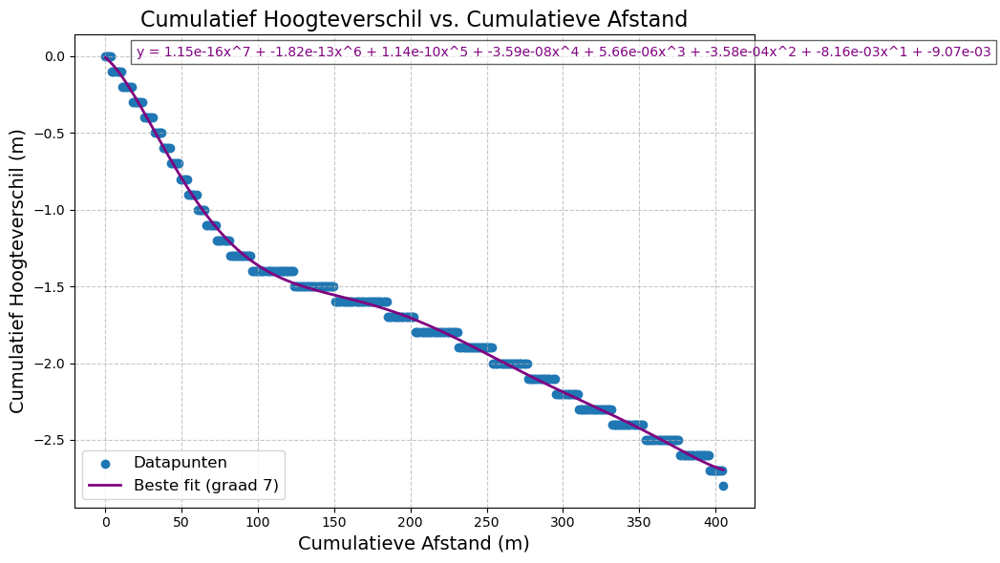

y = 1.15e-16x^7 + -1.82e-13x^6 + 1.14e-10x^5 + -3.59e-08x^4 + 5.66e-06x^3 + -3.58e-04x^2 + -8.16e-03x^1 + -9.07e-03


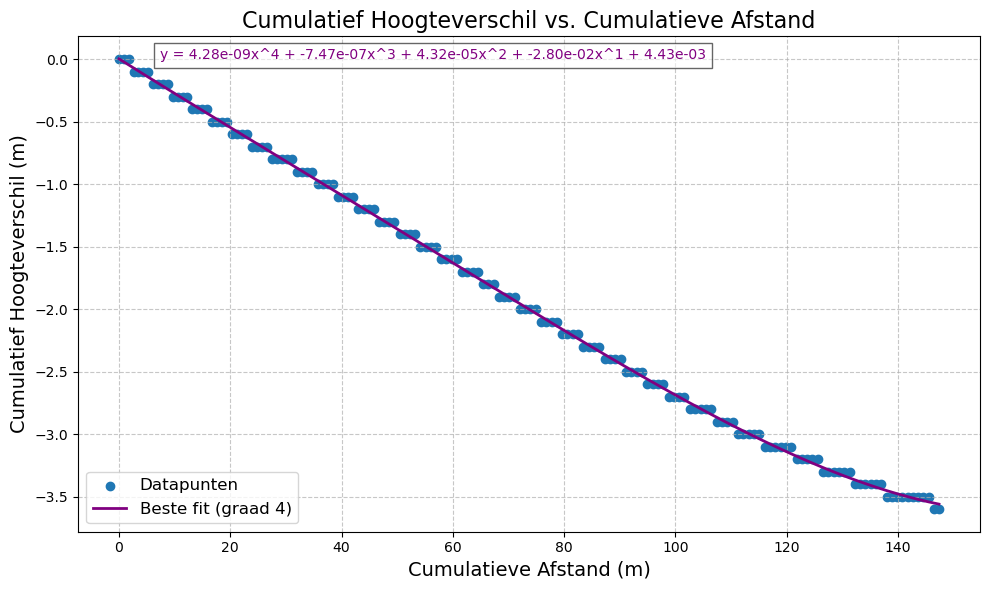

y = 4.28e-09x^4 + -7.47e-07x^3 + 4.32e-05x^2 + -2.80e-02x^1 + 4.43e-03


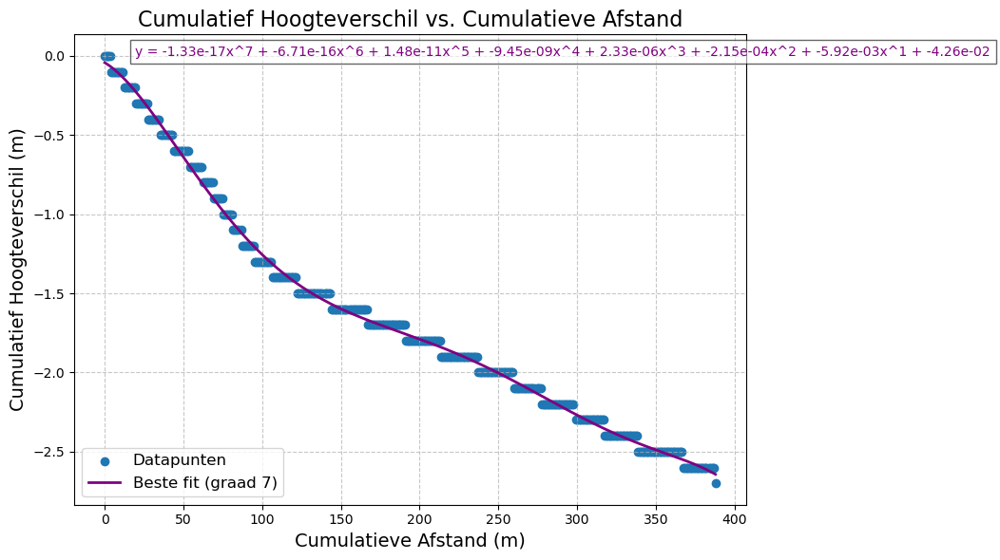

y = -1.33e-17x^7 + -6.71e-16x^6 + 1.48e-11x^5 + -9.45e-09x^4 + 2.33e-06x^3 + -2.15e-04x^2 + -5.92e-03x^1 + -4.26e-02


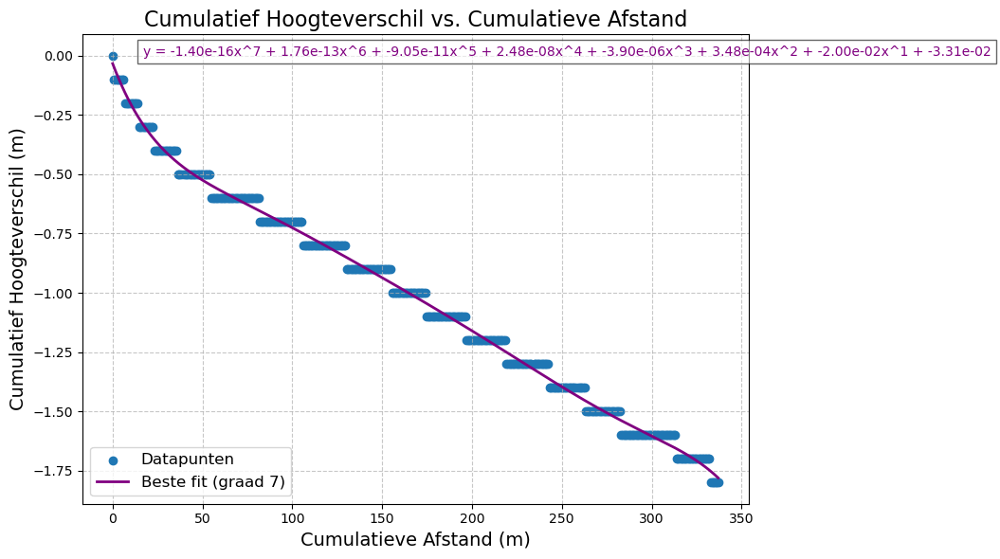

y = -1.40e-16x^7 + 1.76e-13x^6 + -9.05e-11x^5 + 2.48e-08x^4 + -3.90e-06x^3 + 3.48e-04x^2 + -2.00e-02x^1 + -3.31e-02


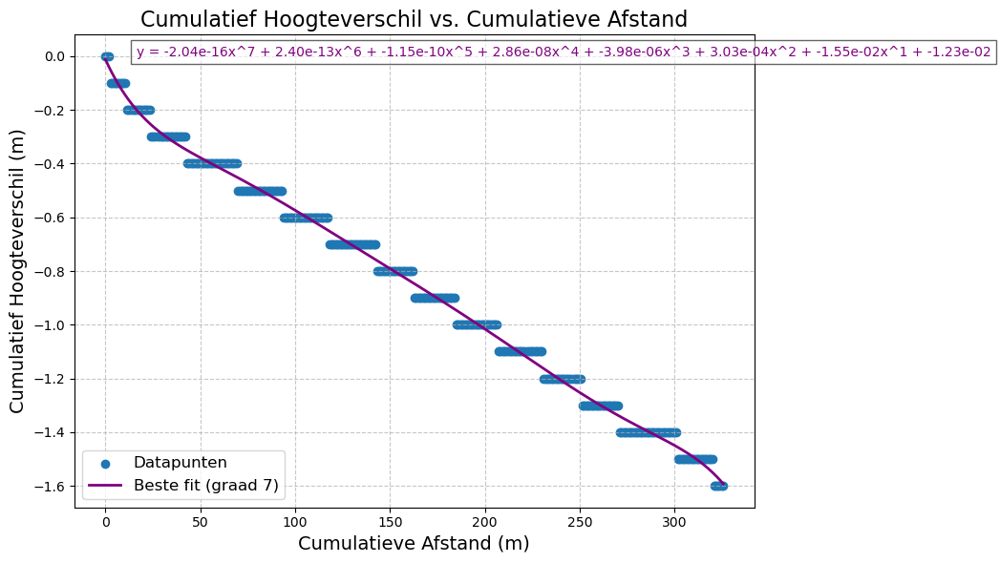

y = -2.04e-16x^7 + 2.40e-13x^6 + -1.15e-10x^5 + 2.86e-08x^4 + -3.98e-06x^3 + 3.03e-04x^2 + -1.55e-02x^1 + -1.23e-02


/Users/willemheemskerk/PycharmProjects/Clean_Mobility/libraries.py:1193: UserWarning:

Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.



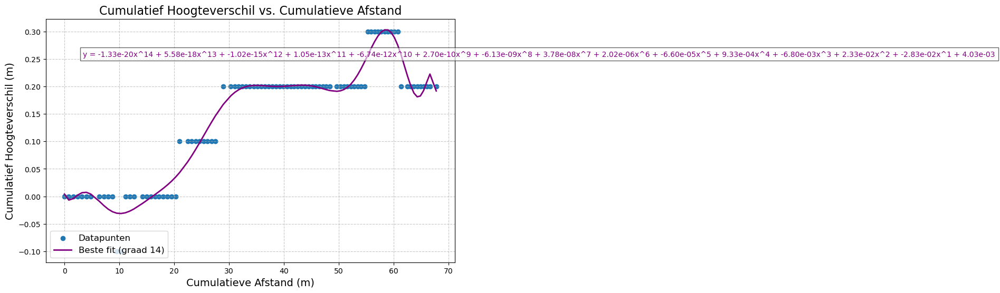

y = -1.33e-20x^14 + 5.58e-18x^13 + -1.02e-15x^12 + 1.05e-13x^11 + -6.74e-12x^10 + 2.70e-10x^9 + -6.13e-09x^8 + 3.78e-08x^7 + 2.02e-06x^6 + -6.60e-05x^5 + 9.33e-04x^4 + -6.80e-03x^3 + 2.33e-02x^2 + -2.83e-02x^1 + 4.03e-03


In [164]:
#Maak een fitvergelijking voor het hoogteprofiel van dit df
#Voeg de polynoom in
"""
    Parameters:
    dataframe (pd.DataFrame): DataFrame met de kolommen 'cumulatieve_afstand' en 'cumulatief_hoogteverschil'.
    polynoom_graad (int): De graad van de polynoom die aan de data wordt aangepast.
"""

polynomial = lib.plot_hoogte_vs_afstand_met_fit(hoogte_met_afstand_df, 7)

polynomial2 = lib.plot_hoogte_vs_afstand_met_fit(hoogte_met_afstand_df2, 4)

polynomial3 = lib.plot_hoogte_vs_afstand_met_fit(hoogte_met_afstand_df3, 7)

polynomial4 = lib.plot_hoogte_vs_afstand_met_fit(hoogte_met_afstand_df4, 7)

polynomial5 = lib.plot_hoogte_vs_afstand_met_fit(hoogte_met_afstand_df5, 7)

polynomial6 = lib.plot_hoogte_vs_afstand_met_fit(hoogte_met_afstand_df6, 14)


In [165]:
"""
    Laadt motordriver-data in, selecteert een subset van rijen, corrigeert GPS-coördinaten
    en voegt snelheden in m/s toe.

    Parameters:
    directory (str): Pad naar de directory met het databestand.
    file_motordriver (str): Naam van het motordriver-databestand.
    start_row (int): Startindex van de te selecteren rijen (inclusief).
    end_row (int): Eindindex van de te selecteren rijen (inclusief).

    Returns:
    pd.DataFrame: Geprocessed DataFrame met geselecteerde rijen, gecorrigeerde GPS-coördinaten
                  en snelheden in m/s.
    """

directory = "/Users/willemheemskerk/Downloads/20230525_h2a_poging1/0002/"
file_motordriver = "5.csv"
start_row = 223257
end_row = 479444

filtered_motordriver = lib.verwerk_motordriver_data(directory, file_motordriver, start_row, end_row)
filtered_motordriver

,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,"Toestand cruise control2-knop (aan=1, uit=0)",Tijdstip laatste verandering cruise control2-knop,"GPS longitude, in graden","GPS latitude, in graden",GPS direction,"GPS speed, in km/h","GPS time, in seconden sinds het begin van de huidige GPS-week",Checksum,"Wielsnelheid, in m/s","GPS speed, in m/s"
223257,5,4540.1490,03|04,898.7554,2.689,9.883,36.8,-1340,31.898,1.225,...,0,0.000,-0.041337,43.770920,333.0,1.7,73857.4,NaN,0.355278,0.472222
223258,5,4540.1571,03|04,898.7634,3.127,10.037,43.2,-1340,31.894,1.325,...,0,0.000,-0.041337,43.770922,333.0,1.7,73857.4,NaN,0.354167,0.472222
223259,5,4540.1652,03|04,898.7716,3.702,10.203,51.8,-1339,31.889,1.454,...,0,0.000,-0.041337,43.770922,339.2,1.7,73857.6,NaN,0.371389,0.472222
223260,5,4540.1734,03|04,898.7796,3.541,10.329,50.1,-1339,31.889,1.499,...,0,0.000,-0.041337,43.770922,339.2,1.7,73857.6,NaN,0.389444,0.472222
223261,5,4540.1815,03|04,898.7878,3.242,10.222,46.2,-1339,31.894,1.391,...,0,0.000,-0.041337,43.770922,339.2,1.7,73857.6,NaN,0.406944,0.472222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
479440,5,6774.8277,03|04,3133.0471,0.021,-0.085,-0.0,181490,30.445,-0.039,...,0,3073.986,-0.041132,43.770612,323.4,3.0,81612.0,NaN,1.195278,0.833333
479441,5,6774.8364,03|04,3133.0559,0.020,-0.084,-0.0,181490,30.445,-0.042,...,0,3073.986,-0.041132,43.770612,323.4,3.0,81612.0,NaN,1.176111,0.833333
479442,5,6774.8451,03|04,3133.0647,0.020,-0.084,-0.0,181490,30.445,-0.045,...,0,3073.986,-0.041132,43.770612,323.4,3.0,81612.0,NaN,1.141389,0.833333
479443,5,6774.8538,03|04,3133.0735,0.020,-0.083,-0.0,181490,30.445,-0.048,...,0,3073.986,-0.041132,43.770612,323.4,3.0,81612.0,NaN,1.112500,0.833333


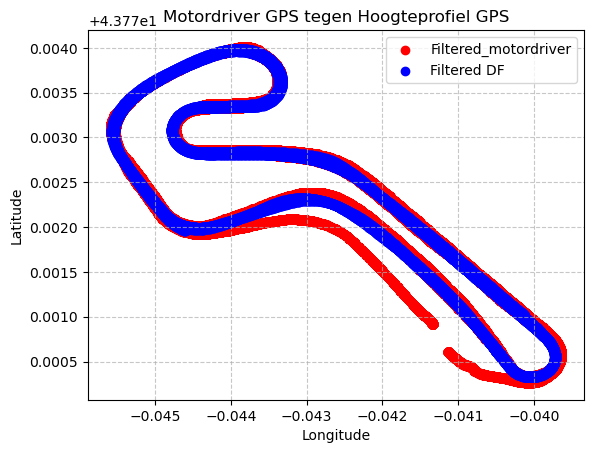

In [166]:
"""
    Laadt de GPS data van de motordriver tegen die van het hoogte df om te checken of het overeenkomt.
    """

plt.title('Motordriver GPS tegen Hoogteprofiel GPS')
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.scatter(filtered_motordriver['GPS longitude, in graden'], filtered_motordriver['GPS latitude, in graden'], color ='r', label= 'Filtered_motordriver')
plt.scatter(filtered_hoogte_df['longitude'], filtered_hoogte_df['latitude'], color='b', label='Filtered DF')
plt.legend()
plt.grid(visible=True, linestyle='--', alpha=0.7)
plt.show()

In [167]:
"""
    Maak apparte dataframes van elke ronde.
        """


#Maken df's per ronde motordriver
begin_eind_paren2 = [
    (0, 26251), 
    (26251, 49486), 
    (49486, 74393), 
    (74393, 100200),
    (100200, 124732), 
    (124732, 149852), 
    (149852, 174488), 
    (174488, 200208),
    (200208, 226012), 
    (226012, 255494)
]

# Maak een lege lijst om de rondes-dataframes op te slaan
rondes = []

# Loop door elke (begin, eind) paar en maak een DataFrame subset
for i, (begin, eind) in enumerate(begin_eind_paren2):
    df_segment = filtered_motordriver.iloc[begin:eind]
    rondes.append(df_segment)

# Je kunt nu elke ronde benaderen als rondes[0], rondes[1], etc.
df_ronde1 = rondes[0]
df_ronde2 = rondes[1]
df_ronde3 = rondes[2]
df_ronde4 = rondes[3]
df_ronde5 = rondes[4]
df_ronde6 = rondes[5]
df_ronde7 = rondes[6]
df_ronde8 = rondes[7]
df_ronde9 = rondes[8]
df_ronde10 = rondes[9]

# Print het resultaat voor een ronde om te controleren
df_ronde7


,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,"Toestand cruise control2-knop (aan=1, uit=0)",Tijdstip laatste verandering cruise control2-knop,"GPS longitude, in graden","GPS latitude, in graden",GPS direction,"GPS speed, in km/h","GPS time, in seconden sinds het begin van de huidige GPS-week",Checksum,"Wielsnelheid, in m/s","GPS speed, in m/s"
373109,5,5837.5808,03|04,2195.9629,21.155,7.969,180.1,114188,27.357,6.742,...,0,2131.384,-0.040835,43.770947,322.7,26.3,80035.0,NaN,7.287778,7.305556
373110,5,5837.5896,03|04,2195.9717,20.881,7.951,176.7,114189,27.356,6.746,...,0,2131.384,-0.040835,43.770947,322.8,26.3,80035.0,NaN,7.443889,7.305556
373111,5,5837.5984,03|04,2195.9807,20.706,7.930,175.4,114191,27.356,6.744,...,0,2131.384,-0.040835,43.770947,322.8,26.3,80035.0,NaN,7.293056,7.305556
373112,5,5837.6073,03|04,2195.9895,20.995,8.003,179.2,114193,27.355,6.746,...,0,2131.384,-0.040835,43.770947,322.8,26.3,80035.0,NaN,7.385833,7.305556
373113,5,5837.6161,03|04,2195.9983,20.981,8.040,180.1,114194,27.354,6.756,...,0,2131.384,-0.040835,43.770947,322.8,26.3,80035.0,NaN,7.293333,7.305556
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
397740,5,6054.6428,03|04,2412.9873,20.286,8.068,175.6,132123,27.457,6.436,...,0,2402.446,-0.040793,43.771008,324.7,24.6,80411.8,NaN,6.807778,6.833333
397741,5,6054.6516,03|04,2412.9961,20.145,7.973,172.4,132125,27.456,6.425,...,0,2402.446,-0.040793,43.771008,324.7,24.6,80411.8,NaN,6.998611,6.833333
397742,5,6054.6605,03|04,2413.0049,20.052,8.024,173.3,132126,27.455,6.431,...,0,2402.446,-0.040793,43.771008,324.7,24.6,80411.8,NaN,6.810556,6.833333
397743,5,6054.6694,03|04,2413.0139,19.878,7.993,171.0,132128,27.454,6.438,...,0,2402.446,-0.040803,43.771018,324.7,24.8,80411.8,NaN,7.021667,6.888889


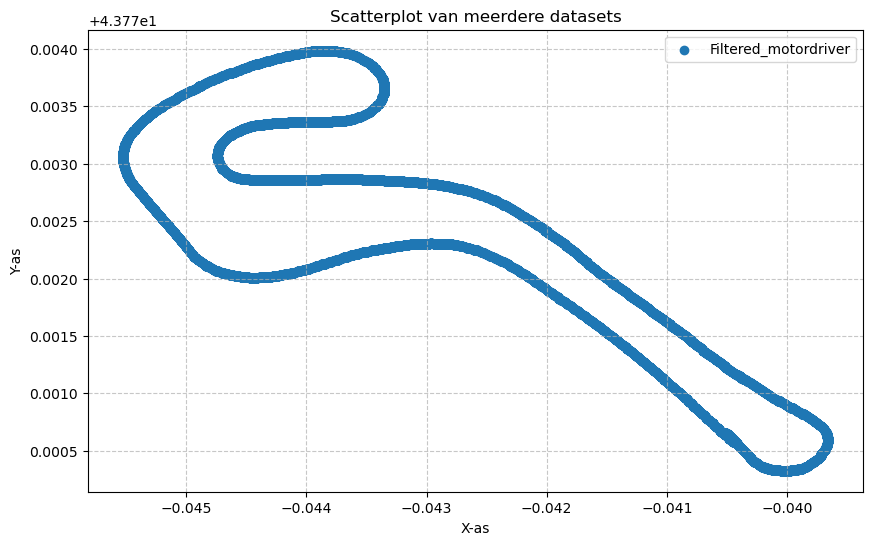

In [168]:
"""
    Maakt een scatterplot van de opgegeven DataFrame-kolommen met een specifiek label.

    Parameters:
    df (pd.DataFrame): De DataFrame met de te plotten data.
    x_col (str): De naam van de kolom voor de x-as.
    y_col (str): De naam van de kolom voor de y-as.
    label (str): Het label voor de dataset in de plot.

    Returns:
    None
    """

# Stel dat 'df_ronde6' de DataFrame is met de benodigde data
lib.plot_scatter((df_ronde3, 'GPS longitude, in graden', 'GPS latitude, in graden', 'Filtered_motordriver'))




In [169]:
"""
    Maakt een scatterplot met Plotly waarbij bij hoveren de rij-index en de x- en y-waarden worden weergegeven,
    en voegt optioneel handmatig opgegeven punten toe op specifieke coördinaten.

    Parameters:
    df (pd.DataFrame): De DataFrame met de te plotten data.
    x_col (str): De naam van de kolom voor de x-as.
    y_col (str): De naam van de kolom voor de y-as.
    label (str): Het label voor de dataset in de plot.
    custom_points (list of tuples, optional): Lijst met tuples, elk met (x, y) coördinaten voor de toe te voegen punten. Standaard is None.

    Returns:
    None
    """

custom_points = [(-0.043588, 43.772817), # filtered_motordriver.loc[388561]
                 (-0.039707, 43.770703), # filtered_motordriver.loc[394866]
                 (-0.045478, 43.773305),
                 (-0.043947, 43.773997),
                 (-0.043483, 43.77286),
                 (-0.039763, 43.77075),
                 (-0.042835, 43.77273),
                 (-0.04269667, 43.7727),
                 (-0.04024833, 43.77037)]

lib.plot_scatter_with_custom_points(filtered_hoogte_df, 'longitude', 'latitude', 'Joehoe', custom_points)

In [170]:
"""
    Maakt een interactieve scatterplot van GPS-coördinaten met kleuren die afhankelijk zijn van het geleverde vermogen.
    Optioneel kunnen aangepaste punten worden toegevoegd.

    Parameters:
    df (pd.DataFrame): DataFrame met de kolommen 'GPS longitude, in graden', 'GPS latitude, in graden' en 'Vermogen geleverd aan de motor (W)'.
    custom_points (list of tuples, optional): Lijst met tuples met (longitude, latitude) coördinaten voor extra punten. Standaard is None.

    Returns:
    Geel = geen vermogen
    Blauw = Wel vermogen
    Rood = Zelf ingevoerde punten
    """

# Aanroepen van de functie met aangepaste punten
lib.plot_gps_power(df_ronde8, custom_points=custom_points)




In [228]:
df_meetstuk = df_ronde7.loc[388569:394865]

df_meetstuk2 = df_ronde7.loc[381414:383153]

df_meetstuk3 = df_ronde3.loc[288962:295389]

df_meetstuk4 = df_ronde10.loc[466828:471680]

df_meetstuk5 = df_ronde5.loc[341436:345649]

df_meetstuk6 = df_ronde8.loc[420437:421842]

df_meetstuk6

,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,"Toestand cruise control2-knop (aan=1, uit=0)",Tijdstip laatste verandering cruise control2-knop,"GPS longitude, in graden","GPS latitude, in graden",GPS direction,"GPS speed, in km/h","GPS time, in seconden sinds het begin van de huidige GPS-week",Checksum,"Wielsnelheid, in m/s","GPS speed, in m/s"
420437,5,6254.8159,03|04,2613.1255,0.019,-0.079,-0.0,146512,29.952,-0.032,...,0,2561.729,-0.039702,43.770700,157.5,25.6,80732.0,NaN,7.034444,7.111111
420438,5,6254.8247,03|04,2613.1345,0.020,-0.078,-0.0,146512,29.952,-0.035,...,0,2561.729,-0.039695,43.770688,157.5,25.7,80732.2,NaN,7.254722,7.138889
420439,5,6254.8335,03|04,2613.1433,0.020,-0.078,-0.0,146512,29.952,-0.036,...,0,2561.729,-0.039695,43.770688,160.0,25.7,80732.2,NaN,7.038889,7.138889
420440,5,6254.8423,03|04,2613.1521,0.020,-0.079,-0.0,146512,29.953,-0.040,...,0,2561.729,-0.039695,43.770688,160.0,25.7,80732.2,NaN,7.250833,7.138889
420441,5,6254.8511,03|04,2613.1609,0.020,-0.080,-0.0,146512,29.954,-0.044,...,0,2561.729,-0.039695,43.770688,160.0,25.7,80732.2,NaN,7.066667,7.138889
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
421838,5,6267.1255,03|04,2625.4331,0.016,-0.082,-0.0,146512,30.272,-0.045,...,0,2561.729,-0.040248,43.770370,313.7,19.1,80744.4,NaN,5.303056,5.305556
421839,5,6267.1343,03|04,2625.4419,0.018,-0.083,-0.0,146512,30.273,-0.042,...,0,2561.729,-0.040248,43.770370,313.7,19.1,80744.4,NaN,5.332222,5.305556
421840,5,6267.1430,03|04,2625.4507,0.018,-0.083,-0.0,146512,30.274,-0.044,...,0,2561.729,-0.040248,43.770370,313.7,19.1,80744.4,NaN,5.159722,5.305556
421841,5,6267.1518,03|04,2625.4595,0.020,-0.084,-0.0,146512,30.274,-0.042,...,0,2561.729,-0.040248,43.770370,313.7,19.1,80744.4,NaN,5.329167,5.305556


In [229]:
# Print de eerste rij
print("Eerste rij:")
df_meetstuk6.head(1)

Eerste rij:


,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,"Toestand cruise control2-knop (aan=1, uit=0)",Tijdstip laatste verandering cruise control2-knop,"GPS longitude, in graden","GPS latitude, in graden",GPS direction,"GPS speed, in km/h","GPS time, in seconden sinds het begin van de huidige GPS-week",Checksum,"Wielsnelheid, in m/s","GPS speed, in m/s"
420437,5,6254.8159,03|04,2613.1255,0.019,-0.079,-0.0,146512,29.952,-0.032,...,0,2561.729,-0.039702,43.7707,157.5,25.6,80732.0,NaN,7.034444,7.111111


In [230]:
# Print de laatste rij
print("\nLaatste rij:")
df_meetstuk6.tail(1)


Laatste rij:


,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,"Toestand cruise control2-knop (aan=1, uit=0)",Tijdstip laatste verandering cruise control2-knop,"GPS longitude, in graden","GPS latitude, in graden",GPS direction,"GPS speed, in km/h","GPS time, in seconden sinds het begin van de huidige GPS-week",Checksum,"Wielsnelheid, in m/s","GPS speed, in m/s"
421842,5,6267.1606,03|04,2625.4683,0.021,-0.082,-0.0,146512,30.274,-0.04,...,0,2561.729,-0.040248,43.77037,313.7,19.1,80744.4,NaN,5.258333,5.305556


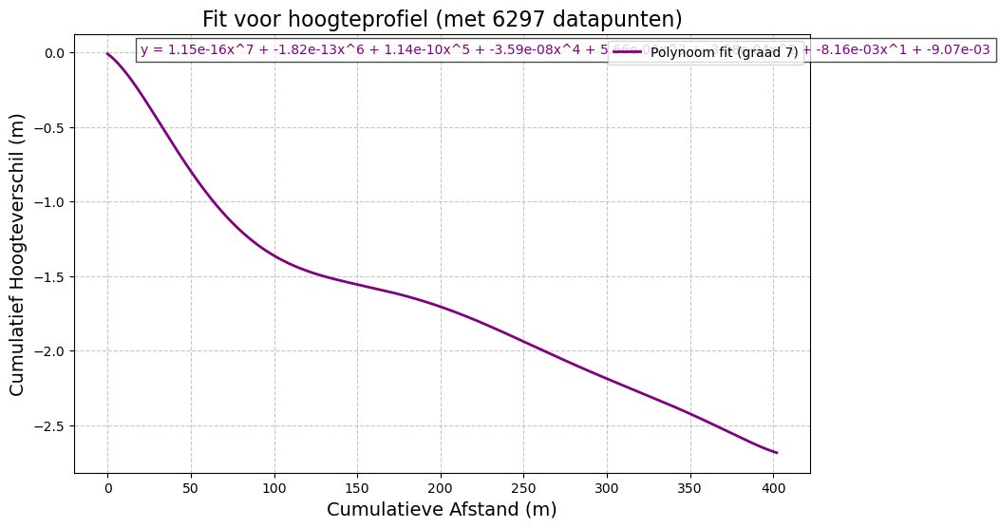

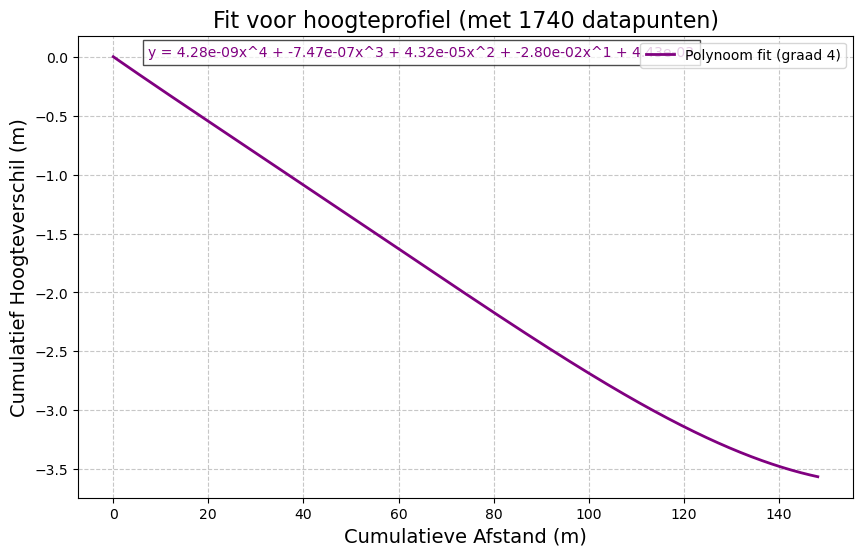

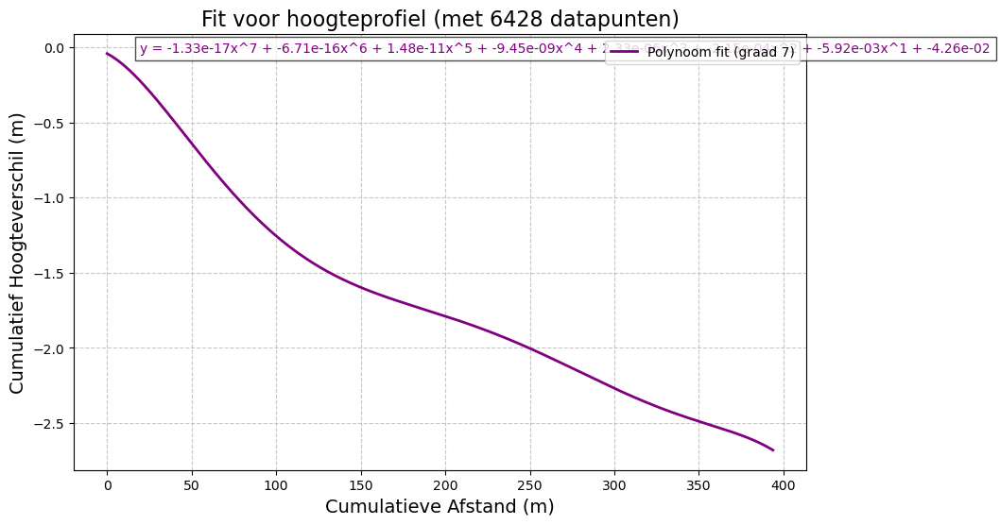

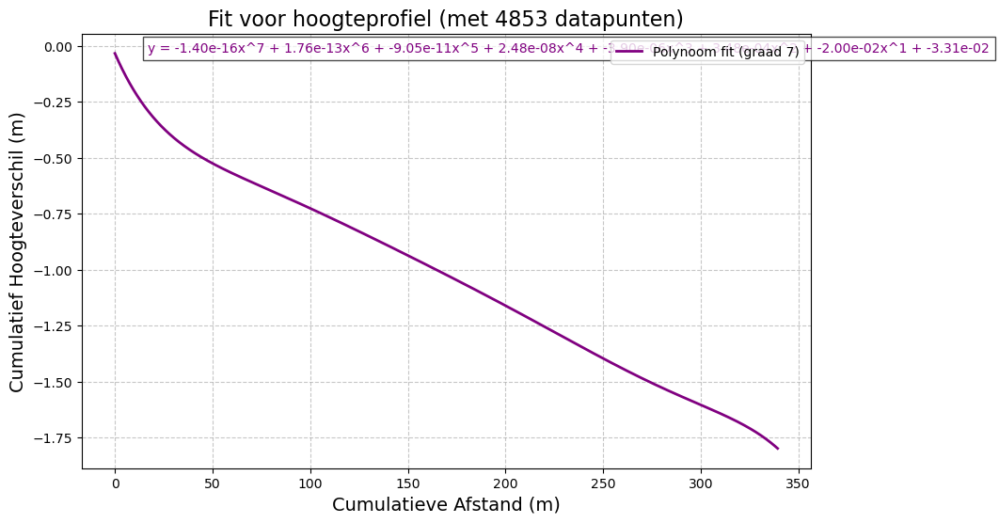

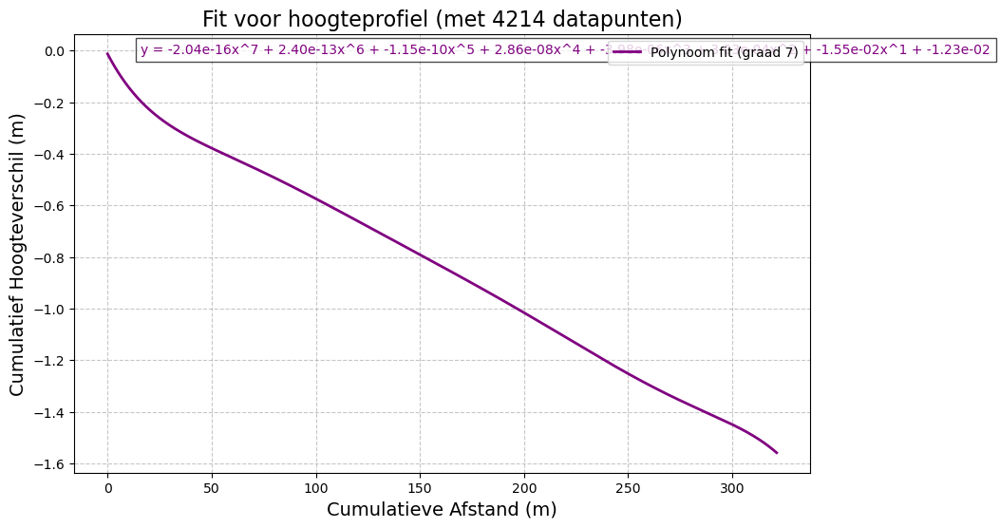

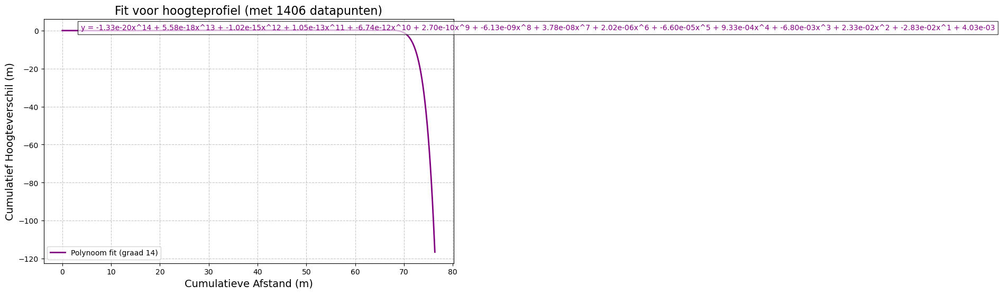

,hoogteverschil (m),delta h (m)
0,0.004030,0.000000
1,0.002561,-0.001469
2,0.001223,-0.001338
3,0.000010,-0.001213
4,-0.001085,-0.001095
...,...,...
1401,-104.030073,-2.936718
1402,-107.040806,-3.010733
1403,-110.127169,-3.086363
1404,-113.290808,-3.163640


In [231]:
"""
    Voert een polynoomfit uit op het hoogteprofiel, plot de fit en berekent het hoogteverschil.

    Parameters:
    dataframe (pd.DataFrame): DataFrame met de kolommen 'cumulatieve_afstand' en 'cumulatief_hoogteverschil'.
    polynoom_graad (int): De graad van de polynoom die aan de data wordt aangepast.
    x_fit_start (float): De startwaarde voor de x-as bij het genereren van de fit.
    x_fit_end (float): De eindwaarde voor de x-as bij het genereren van de fit.
    num_points (int): Het aantal punten voor de x-as bij het genereren van de fit.

    Returns:
    pd.DataFrame: DataFrame met de berekende hoogteverschillen en hun verschillen.
    """
# Aanroepen van de functie
df_h = lib.analyseer_hoogteprofiel(hoogte_met_afstand_df, polynoom_graad=7, x_fit_start=0, x_fit_end=402, num_points=6297)

df_h2 = lib.analyseer_hoogteprofiel(hoogte_met_afstand_df2, polynoom_graad=4, x_fit_start=0, x_fit_end=148.18, num_points=1740)

df_h3 = lib.analyseer_hoogteprofiel(hoogte_met_afstand_df3, polynoom_graad=7, x_fit_start=0, x_fit_end=393.82, num_points=6428)

df_h4 = lib.analyseer_hoogteprofiel(hoogte_met_afstand_df4, polynoom_graad=7, x_fit_start=0, x_fit_end=339.39, num_points=4853)

df_h5 = lib.analyseer_hoogteprofiel(hoogte_met_afstand_df5, polynoom_graad=7, x_fit_start=0, x_fit_end=321.29, num_points=4214)

df_h6 = lib.analyseer_hoogteprofiel(hoogte_met_afstand_df6, polynoom_graad=14, x_fit_start=0, x_fit_end=76.32, num_points=1406)

# Bekijken van de eerste paar rijen van het resultaat
df_h6




In [232]:
import numpy as np
import pandas as pd

def haversine(lat1, lon1, lat2, lon2):
    """
    Calculate the great-circle distance (in meters) between two points
    on the Earth specified by latitude and longitude.
    """
    R = 6371000  # Earth's radius in meters
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat / 2.0) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2.0) ** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return R * c

def bereken_energie(df):
    """
    Bereken de potentiële en kinetische energie op basis van hoogte-, snelheid- en GPS-afstandsgegevens.

    Parameters:
    df (pd.DataFrame): DataFrame met de kolommen 'hoogteverschil (m)', 'Wielsnelheid, in m/s',
                       'GPS speed, in m/s', 'GPS latitude, in graden', 'GPS longitude, in graden'.

    Returns:
    pd.DataFrame: DataFrame met berekende energieën en weerstand.
    """
    g = 9.81  # Zwaartekrachtversnelling in m/s²
    massa = 90  # Massa van het object in kilogram

    # Drop rows with missing latitude or longitude
    df = df.dropna(subset=['GPS latitude, in graden', 'GPS longitude, in graden']).reset_index(drop=True)

    # Calculate GPS distances between consecutive rows
    df['GPS afstand (m)'] = haversine(
        df['GPS latitude, in graden'].shift(1),
        df['GPS longitude, in graden'].shift(1),
        df['GPS latitude, in graden'],
        df['GPS longitude, in graden']
    )

    # Replace NaN in the first row (since shift(1) causes it) with 0
    df['GPS afstand (m)'] = df['GPS afstand (m)'].fillna(0)

    # Cumulative distance
    df['Afgelegde afstand (m)'] = df['GPS afstand (m)'].cumsum()
    df['Afgelegde afstand wiel (m)'] = df['Afgelegde afstand sinds laatste herstart motordriver (m)'] - df['Afgelegde afstand sinds laatste herstart motordriver (m)'].iloc[0]

    # Energies calculations
    initiele_hoogte = df['hoogteverschil (m)'].iloc[0]  # Starting height
    df['Potentiële Energie (J)'] = massa * g * (df['hoogteverschil (m)'] - initiele_hoogte).abs()
    df['Delta Potentiële Energie (J)'] = df['Potentiële Energie (J)'].diff().fillna(0)
    df['Cumulatieve Omzetting naar Kinetische Energie (J)'] = df['Delta Potentiële Energie (J)'].cumsum()

    # Initial kinetic energy based on the first row's speed
    begin_snelheid = df['GPS speed, in m/s'].iloc[0]
    begin_snelheid_wiel = df['Wielsnelheid, in m/s'].iloc[0]
    initiele_kinetische_energie = 0.5 * massa * (begin_snelheid_wiel ** 2)
    initiele_kinetische_energie_wiel = 0.5 * massa * (begin_snelheid_wiel ** 2)

    #berekent met gps snelheid
    df['Theoretische Kinetische Energie (J)'] = initiele_kinetische_energie - df['Cumulatieve Omzetting naar Kinetische Energie (J)']

    df['Totale theoretische energie (J)'] = df['Theoretische Kinetische Energie (J)'] + df['Potentiële Energie (J)']

    #berekent met wielsnelheid
    df['Theoretische Kinetische Energie wiel (J)'] = initiele_kinetische_energie_wiel - df['Cumulatieve Omzetting naar Kinetische Energie (J)']

    df['Totale theoretische energie wiel (J)'] = df['Theoretische Kinetische Energie wiel (J)'] + df['Potentiële Energie (J)']

    # Measured kinetic energy based on GPS speed
    df['Gemeten kinetische energie (GPS) (J)'] = 0.5 * massa * (df['GPS speed, in m/s'] ** 2)
    df['Totale gemeten energie (GPS) (J)'] = df['Gemeten kinetische energie (GPS) (J)'] + df['Potentiële Energie (J)']

    # Resistance calculation GPS snelheid
    df['Energie verschil berekend en gemeten (J)'] = df['Totale theoretische energie (J)'] - df['Totale gemeten energie (GPS) (J)']
    df['delta energie berekend en gemeten (J)'] = df['Energie verschil berekend en gemeten (J)'].diff().fillna(0)
    df['delta afstand (m)'] = df['Afgelegde afstand (m)'].diff()
    df['Weerstand met GPS Snelheid (N)'] = df['delta energie berekend en gemeten (J)'] / df['delta afstand (m)']

    # Resistance calculation wielsnelheid
    df['Energie verschil berekend en gemeten wiel (J)'] = df['Totale theoretische energie wiel (J)'] - df['Totale gemeten energie (GPS) (J)']

    df['delta energie berekend en gemeten wiel (J)'] = df['Energie verschil berekend en gemeten wiel (J)'].diff().fillna(0)

    df['delta afstand wiel (m)'] = df['Afgelegde afstand wiel (m)'].diff()

    df['Weerstand met GPS Snelheid wiel (N)'] = df['delta energie berekend en gemeten wiel (J)'] / df['delta afstand wiel (m)']

    return df


In [233]:


# Controleer of beide DataFrames dezelfde lengte hebben
# Dit is essentieel om ervoor te zorgen dat de rijen correct op elkaar worden afgestemd bij het samenvoegen.
if len(df_meetstuk) != len(df_h):
    raise ValueError("De DataFrames hebben niet dezelfde lengte en kunnen niet direct worden samengevoegd.")

# Stap 1: Identificeer de kolommen die al bestaan in df_meetstuk
# Dit wordt gedaan door de intersectie te nemen van de kolommen van beide DataFrames.
bestaande_kolommen = df_meetstuk.columns.intersection(df_h.columns)

# Stap 2: Verwijder de bestaande kolommen uit df_h
# Hierdoor blijven alleen de kolommen over die nog niet in df_meetstuk aanwezig zijn.
df_h_uniek = df_h.drop(columns=bestaande_kolommen)

# Stap 3: Voeg de DataFrames samen
# Beide DataFrames worden eerst gereset naar een standaard numerieke index om ervoor te zorgen dat de rijen correct worden uitgelijnd.
# Vervolgens worden ze
# kolomgewijs samengevoegd met behulp van pd.concat.
df_meetstuk = pd.concat([df_meetstuk.reset_index(drop=True), df_h_uniek.reset_index(drop=True)], axis=1)

# Toon het bijgewerkte DataFrame
# Dit geeft een overzicht van df_meetstuk met de toegevoegde kolommen uit df_h.
df_meetstuk


,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,"GPS longitude, in graden","GPS latitude, in graden",GPS direction,"GPS speed, in km/h","GPS time, in seconden sinds het begin van de huidige GPS-week",Checksum,"Wielsnelheid, in m/s","GPS speed, in m/s",hoogteverschil (m),delta h (m)
0,5,5973.8667,03|04,2332.2251,0.722,-0.054,-0.0,129044,27.371,-0.014,...,-0.043572,43.772815,96.7,24.4,80251.2,NaN,6.916389,6.777778,-0.009065,0.000000
1,5,5973.8755,03|04,2332.2339,0.705,-0.055,-0.0,129044,27.371,-0.012,...,-0.043572,43.772815,96.7,24.4,80251.2,NaN,6.823611,6.777778,-0.009588,-0.000523
2,5,5973.8842,03|04,2332.2427,0.688,-0.053,-0.0,129044,27.371,-0.015,...,-0.043572,43.772815,96.7,24.4,80251.2,NaN,6.919722,6.777778,-0.010113,-0.000525
3,5,5973.8930,03|04,2332.2515,0.668,-0.055,-0.0,129044,27.372,-0.014,...,-0.043572,43.772815,96.7,24.4,80251.2,NaN,6.810000,6.777778,-0.010641,-0.000528
4,5,5973.9018,03|04,2332.2603,0.650,-0.055,-0.0,129044,27.372,-0.014,...,-0.043572,43.772815,96.7,24.4,80251.2,NaN,6.920833,6.777778,-0.011173,-0.000531
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6292,5,6029.1495,03|04,2387.4983,0.021,-0.079,-0.0,129044,30.269,-0.042,...,-0.039715,43.770713,153.6,24.6,80346.4,NaN,6.776944,6.833333,-2.684315,-0.000229
6293,5,6029.1583,03|04,2387.5071,0.020,-0.078,-0.0,129044,30.269,-0.042,...,-0.039715,43.770713,153.6,24.6,80346.4,NaN,6.955000,6.833333,-2.684543,-0.000228
6294,5,6029.1671,03|04,2387.5161,0.019,-0.078,-0.0,129044,30.269,-0.044,...,-0.039715,43.770713,153.6,24.6,80346.4,NaN,6.768889,6.833333,-2.684771,-0.000228
6295,5,6029.1759,03|04,2387.5249,0.019,-0.078,-0.0,129044,30.269,-0.039,...,-0.039715,43.770713,153.6,24.6,80346.4,NaN,6.943611,6.833333,-2.684998,-0.000227


In [234]:

# Bereken de energieën
df_energie = bereken_energie(df_meetstuk)

# Controleer of beide DataFrames dezelfde lengte hebben
if len(df_meetstuk) != len(df_energie):
    raise ValueError("De DataFrames hebben niet dezelfde lengte en kunnen niet direct worden samengevoegd.")

# Stap 1: Identificeer de kolommen die al bestaan in df_meetstuk
bestaande_kolommen = df_meetstuk.columns.intersection(df_energie.columns)

# Stap 2: Verwijder de bestaande kolommen uit df_energie
df_energie_uniek = df_energie.drop(columns=bestaande_kolommen)

# Stap 3: Voeg de DataFrames samen
df_meetstuk = pd.concat([df_meetstuk.reset_index(drop=True), df_energie_uniek.reset_index(drop=True)], axis=1)

df_meetstuk = lib.process_angular_data(df_meetstuk, direction_col='GPS direction', reference_direction=90.0)

# Toon het bijgewerkte DataFrame
df_meetstuk



,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,delta afstand (m),Weerstand met GPS Snelheid (N),Energie verschil berekend en gemeten wiel (J),delta energie berekend en gemeten wiel (J),delta afstand wiel (m),Weerstand met GPS Snelheid wiel (N),Bearing (°),Difference from Reference (°),Color,Label
0,5,5973.8667,03|04,2332.2251,0.722,-0.054,-0.0,129044,27.371,-0.014,...,NaN,NaN,85.417365,0.000000,NaN,NaN,NaN,6.7,deeppink,"Hoek is groter dan 4,5 graden"
1,5,5973.8755,03|04,2332.2339,0.705,-0.055,-0.0,129044,27.371,-0.012,...,0.0,-inf,84.956048,-0.461317,0.06,-7.688617,0.0,6.7,red,Hoek is 0 graden
2,5,5973.8842,03|04,2332.2427,0.688,-0.053,-0.0,129044,27.371,-0.015,...,0.0,-inf,84.492163,-0.463884,0.06,-7.731403,0.0,6.7,red,Hoek is 0 graden
3,5,5973.8930,03|04,2332.2515,0.668,-0.055,-0.0,129044,27.372,-0.014,...,0.0,-inf,84.025720,-0.466444,0.06,-7.774059,0.0,6.7,red,Hoek is 0 graden
4,5,5973.9018,03|04,2332.2603,0.650,-0.055,-0.0,129044,27.372,-0.014,...,0.0,-inf,83.556725,-0.468995,0.07,-6.699930,0.0,6.7,red,Hoek is 0 graden
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6292,5,6029.1495,03|04,2387.4983,0.021,-0.079,-0.0,129044,30.269,-0.042,...,0.0,-inf,-2310.588379,-0.202132,0.12,-1.684437,0.0,63.6,red,Hoek is 0 graden
6293,5,6029.1583,03|04,2387.5071,0.020,-0.078,-0.0,129044,30.269,-0.042,...,0.0,-inf,-2310.789937,-0.201558,0.00,-inf,0.0,63.6,red,Hoek is 0 graden
6294,5,6029.1671,03|04,2387.5161,0.019,-0.078,-0.0,129044,30.269,-0.044,...,0.0,-inf,-2310.990918,-0.200981,0.12,-1.674845,0.0,63.6,red,Hoek is 0 graden
6295,5,6029.1759,03|04,2387.5249,0.019,-0.078,-0.0,129044,30.269,-0.039,...,0.0,-inf,-2311.191321,-0.200403,0.00,-inf,0.0,63.6,red,Hoek is 0 graden


In [235]:
# Controleer of beide DataFrames dezelfde lengte hebben
if len(df_meetstuk2) != len(df_h2):
    raise ValueError("De DataFrames hebben niet dezelfde lengte en kunnen niet direct worden samengevoegd.")

# Stap 1: Identificeer de kolommen die al bestaan in df_meetstuk2
bestaande_kolommen = df_meetstuk2.columns.intersection(df_h2.columns)

# Stap 2: Verwijder de bestaande kolommen uit df_h2
df_h2_uniek = df_h2.drop(columns=bestaande_kolommen)

# Stap 3: Voeg de DataFrames samen
df_meetstuk2 = pd.concat([df_meetstuk2.reset_index(drop=True), df_h2_uniek.reset_index(drop=True)], axis=1)

# Toon het bijgewerkte DataFrame
df_meetstuk2

,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,"GPS longitude, in graden","GPS latitude, in graden",GPS direction,"GPS speed, in km/h","GPS time, in seconden sinds het begin van de huidige GPS-week",Checksum,"Wielsnelheid, in m/s","GPS speed, in m/s",hoogteverschil (m),delta h (m)
0,5,5910.7529,03|04,2269.1223,0.022,-0.045,-0.0,124365,26.758,-0.003,...,-0.045478,43.773305,39.5,29.1,80148.0,NaN,8.343889,8.083333,0.004434,0.000000
1,5,5910.7617,03|04,2269.1311,0.023,-0.045,-0.0,124365,26.760,-0.005,...,-0.045465,43.773317,39.5,29.1,80148.0,NaN,8.255000,8.083333,0.002044,-0.002389
2,5,5910.7704,03|04,2269.1399,0.023,-0.047,-0.0,124365,26.762,0.000,...,-0.045465,43.773317,41.2,29.3,80148.2,NaN,8.273889,8.138889,-0.000344,-0.002389
3,5,5910.7791,03|04,2269.1484,0.023,-0.048,-0.0,124365,26.764,-0.009,...,-0.045465,43.773317,41.2,29.3,80148.2,NaN,8.317778,8.138889,-0.002732,-0.002388
4,5,5910.7879,03|04,2269.1572,0.023,-0.049,-0.0,124365,26.765,-0.012,...,-0.045465,43.773317,41.2,29.3,80148.2,NaN,8.239722,8.138889,-0.005119,-0.002387
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1735,5,5925.9960,03|04,2284.3625,0.023,-0.059,-0.0,124365,28.331,-0.027,...,-0.043947,43.773997,75.4,38.0,80203.2,NaN,10.493889,10.555556,-3.563616,-0.000759
1736,5,5926.0048,03|04,2284.3713,0.022,-0.060,-0.0,124365,28.332,-0.030,...,-0.043947,43.773997,75.4,38.0,80203.2,NaN,10.625833,10.555556,-3.564371,-0.000755
1737,5,5926.0135,03|04,2284.3801,0.023,-0.061,-0.0,124365,28.333,-0.029,...,-0.043947,43.773997,75.4,38.0,80203.2,NaN,10.578611,10.555556,-3.565122,-0.000751
1738,5,5926.0223,03|04,2284.3889,0.023,-0.062,-0.0,124365,28.333,-0.026,...,-0.043947,43.773997,75.4,38.0,80203.2,NaN,10.485278,10.555556,-3.565868,-0.000747


In [236]:
# Bereken de energieën
df_energie2 = bereken_energie(df_meetstuk2)

# Controleer of beide DataFrames dezelfde lengte hebben
if len(df_meetstuk2) != len(df_energie2):
    raise ValueError("De DataFrames hebben niet dezelfde lengte en kunnen niet direct worden samengevoegd.")

# Stap 1: Identificeer de kolommen die al bestaan in df_meetstuk2
bestaande_kolommen = df_meetstuk2.columns.intersection(df_energie2.columns)

# Stap 2: Verwijder de bestaande kolommen uit df_energie2
df_energie2_uniek = df_energie2.drop(columns=bestaande_kolommen)

# Stap 3: Voeg de DataFrames samen
df_meetstuk2 = pd.concat([df_meetstuk2.reset_index(drop=True), df_energie2_uniek.reset_index(drop=True)], axis=1)

df_meetstuk2 = lib.process_angular_data(df_meetstuk2, direction_col='GPS direction', reference_direction=90.0)

# Toon het bijgewerkte DataFrame
df_meetstuk2


,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,delta afstand (m),Weerstand met GPS Snelheid (N),Energie verschil berekend en gemeten wiel (J),delta energie berekend en gemeten wiel (J),delta afstand wiel (m),Weerstand met GPS Snelheid wiel (N),Bearing (°),Difference from Reference (°),Color,Label
0,5,5910.7529,03|04,2269.1223,0.022,-0.045,-0.0,124365,26.758,-0.003,...,NaN,NaN,192.609181,0.000000,NaN,NaN,NaN,50.5,deeppink,"Hoek is groter dan 4,5 graden"
1,5,5910.7617,03|04,2269.1311,0.023,-0.045,-0.0,124365,26.760,-0.005,...,1.681968,-1.254122,190.499787,-2.109394,0.07,-30.134199,0.0,50.5,red,Hoek is 0 graden
2,5,5910.7704,03|04,2269.1399,0.023,-0.047,-0.0,124365,26.762,0.000,...,0.000000,-inf,147.835389,-42.664397,0.06,-711.073290,1.7,48.8,purple,"Hoek is tussen 1,5 en 2,0 graden"
3,5,5910.7791,03|04,2269.1484,0.023,-0.048,-0.0,124365,26.764,-0.009,...,0.000000,-inf,145.727097,-2.108292,0.06,-35.138204,0.0,48.8,red,Hoek is 0 graden
4,5,5910.7879,03|04,2269.1572,0.023,-0.049,-0.0,124365,26.765,-0.012,...,0.000000,-inf,143.619352,-2.107745,0.06,-35.129084,0.0,48.8,red,Hoek is 0 graden
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1735,5,5925.9960,03|04,2284.3625,0.023,-0.059,-0.0,124365,28.331,-0.027,...,0.000000,-inf,-5031.198533,-0.669793,0.06,-11.163224,0.0,14.6,red,Hoek is 0 graden
1736,5,5926.0048,03|04,2284.3713,0.022,-0.060,-0.0,124365,28.332,-0.030,...,0.000000,-inf,-5031.864820,-0.666287,0.06,-11.104779,0.0,14.6,red,Hoek is 0 graden
1737,5,5926.0135,03|04,2284.3801,0.023,-0.061,-0.0,124365,28.333,-0.029,...,0.000000,-inf,-5032.527594,-0.662774,0.13,-5.098263,0.0,14.6,red,Hoek is 0 graden
1738,5,5926.0223,03|04,2284.3889,0.023,-0.062,-0.0,124365,28.333,-0.026,...,0.000000,-inf,-5033.186850,-0.659256,0.12,-5.493798,0.0,14.6,red,Hoek is 0 graden


In [237]:
# Controleer of beide DataFrames dezelfde lengte hebben
if len(df_meetstuk3) != len(df_h3):
    raise ValueError("De DataFrames hebben niet dezelfde lengte en kunnen niet direct worden samengevoegd.")

# Stap 1: Identificeer de kolommen die al bestaan in df_meetstuk3
bestaande_kolommen = df_meetstuk3.columns.intersection(df_h3.columns)

# Stap 2: Verwijder de bestaande kolommen uit df_h3
df_h3_uniek = df_h3.drop(columns=bestaande_kolommen)

# Stap 3: Voeg de DataFrames samen
df_meetstuk3 = pd.concat([df_meetstuk3.reset_index(drop=True), df_h3_uniek.reset_index(drop=True)], axis=1)

# Toon het bijgewerkte DataFrame
df_meetstuk3


,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,"GPS longitude, in graden","GPS latitude, in graden",GPS direction,"GPS speed, in km/h","GPS time, in seconden sinds het begin van de huidige GPS-week",Checksum,"Wielsnelheid, in m/s","GPS speed, in m/s",hoogteverschil (m),delta h (m)
0,5,5104.2137,03|04,1462.7227,0.339,-0.053,-0.0,58328,28.123,0.003,...,-0.043483,43.77286,93.4,24.1,74821.4,NaN,6.791944,6.694444,-0.042566,0.000000
1,5,5104.2223,03|04,1462.7312,0.323,-0.053,-0.0,58328,28.124,0.003,...,-0.043465,43.77286,93.4,24.1,74821.6,NaN,6.741389,6.694444,-0.042930,-0.000364
2,5,5104.2308,03|04,1462.7397,0.306,-0.051,-0.0,58328,28.125,0.008,...,-0.043465,43.77286,92.9,24.1,74821.6,NaN,6.763889,6.694444,-0.043295,-0.000365
3,5,5104.2394,03|04,1462.7484,0.290,-0.051,-0.0,58328,28.127,0.005,...,-0.043465,43.77286,92.9,24.1,74821.6,NaN,6.771111,6.694444,-0.043662,-0.000367
4,5,5104.2480,03|04,1462.7572,0.273,-0.053,-0.0,58328,28.127,0.008,...,-0.043465,43.77286,92.9,24.1,74821.6,NaN,6.717778,6.694444,-0.044031,-0.000369
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6423,5,5159.7457,03|04,1518.2450,0.020,-0.066,-0.0,58328,30.596,-0.019,...,-0.039763,43.77075,134.9,23.7,74917.0,NaN,6.689722,6.583333,-2.678479,-0.000415
6424,5,5159.7543,03|04,1518.2535,0.020,-0.067,-0.0,58328,30.596,-0.016,...,-0.039763,43.77075,134.9,23.7,74917.0,NaN,6.596389,6.583333,-2.678895,-0.000416
6425,5,5159.7630,03|04,1518.2622,0.019,-0.066,-0.0,58328,30.596,-0.019,...,-0.039763,43.77075,134.9,23.7,74917.0,NaN,6.680833,6.583333,-2.679311,-0.000417
6426,5,5159.7716,03|04,1518.2710,0.019,-0.066,-0.0,58328,30.596,-0.017,...,-0.039763,43.77075,134.9,23.7,74917.0,NaN,6.637222,6.583333,-2.679729,-0.000418


In [238]:
# Bereken de energieën
df_energie3 = bereken_energie(df_meetstuk3)

# Controleer of beide DataFrames dezelfde lengte hebben
if len(df_meetstuk3) != len(df_energie3):
    raise ValueError("De DataFrames hebben niet dezelfde lengte en kunnen niet direct worden samengevoegd.")

# Stap 1: Identificeer de kolommen die al bestaan in df_meetstuk3
bestaande_kolommen = df_meetstuk3.columns.intersection(df_energie3.columns)

# Stap 2: Verwijder de bestaande kolommen uit df_energie3
df_energie3_uniek = df_energie3.drop(columns=bestaande_kolommen)

# Stap 3: Voeg de DataFrames samen
df_meetstuk3 = pd.concat([df_meetstuk3.reset_index(drop=True), df_energie3_uniek.reset_index(drop=True)], axis=1)

df_meetstuk3 = lib.process_angular_data(df_meetstuk3, direction_col='GPS direction', reference_direction=90.0)
# Toon het bijgewerkte DataFrame
df_meetstuk3


,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,delta afstand (m),Weerstand met GPS Snelheid (N),Energie verschil berekend en gemeten wiel (J),delta energie berekend en gemeten wiel (J),delta afstand wiel (m),Weerstand met GPS Snelheid wiel (N),Bearing (°),Difference from Reference (°),Color,Label
0,5,5104.2137,03|04,1462.7227,0.339,-0.053,-0.0,58328,28.123,0.003,...,NaN,NaN,59.171531,0.000000,NaN,NaN,NaN,3.4,deeppink,"Hoek is groter dan 4,5 graden"
1,5,5104.2223,03|04,1462.7312,0.323,-0.053,-0.0,58328,28.124,0.003,...,1.47203,-0.218225,58.850298,-0.321233,0.06,-5.353884,0.0,3.4,red,Hoek is 0 graden
2,5,5104.2308,03|04,1462.7397,0.306,-0.051,-0.0,58328,28.125,0.008,...,0.00000,-inf,58.527641,-0.322658,0.06,-5.377627,0.5,2.9,orange,"Hoek is tussen 0 en 0,5 graden"
3,5,5104.2394,03|04,1462.7484,0.290,-0.051,-0.0,58328,28.127,0.005,...,0.00000,-inf,58.203561,-0.324079,0.06,-5.401322,0.0,2.9,red,Hoek is 0 graden
4,5,5104.2480,03|04,1462.7572,0.273,-0.053,-0.0,58328,28.127,0.008,...,0.00000,-inf,57.878063,-0.325498,0.07,-4.649975,0.0,2.9,red,Hoek is 0 graden
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6423,5,5159.7457,03|04,1518.2450,0.020,-0.066,-0.0,58328,30.596,-0.019,...,0.00000,-inf,-2201.687032,-0.366513,0.06,-6.108546,0.0,44.9,red,Hoek is 0 graden
6424,5,5159.7543,03|04,1518.2535,0.020,-0.067,-0.0,58328,30.596,-0.016,...,0.00000,-inf,-2202.054267,-0.367234,0.07,-5.246206,0.0,44.9,red,Hoek is 0 graden
6425,5,5159.7630,03|04,1518.2622,0.019,-0.066,-0.0,58328,30.596,-0.019,...,0.00000,-inf,-2202.422225,-0.367958,0.06,-6.132634,0.0,44.9,red,Hoek is 0 graden
6426,5,5159.7716,03|04,1518.2710,0.019,-0.066,-0.0,58328,30.596,-0.017,...,0.00000,-inf,-2202.790908,-0.368684,0.06,-6.144727,0.0,44.9,red,Hoek is 0 graden


In [239]:
# Controleer of beide DataFrames dezelfde lengte hebben
if len(df_meetstuk4) != len(df_h4):
    raise ValueError("De DataFrames hebben niet dezelfde lengte en kunnen niet direct worden samengevoegd.")

# Stap 1: Identificeer de kolommen die al bestaan in df_meetstuk3
bestaande_kolommen = df_meetstuk4.columns.intersection(df_h4.columns)

# Stap 2: Verwijder de bestaande kolommen uit df_h3
df_h4_uniek = df_h4.drop(columns=bestaande_kolommen)

# Stap 3: Voeg de DataFrames samen
df_meetstuk4 = pd.concat([df_meetstuk4.reset_index(drop=True), df_h4_uniek.reset_index(drop=True)], axis=1)

# Toon het bijgewerkte DataFrame
df_meetstuk4


,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,"GPS longitude, in graden","GPS latitude, in graden",GPS direction,"GPS speed, in km/h","GPS time, in seconden sinds het begin van de huidige GPS-week",Checksum,"Wielsnelheid, in m/s","GPS speed, in m/s",hoogteverschil (m),delta h (m)
0,5,6664.4076,03|04,3022.6462,0.552,-0.056,-0.0,180475,26.798,-0.012,...,-0.042835,43.772727,107.6,30.4,81421.6,NaN,8.630556,8.444444,-0.033116,0.000000
1,5,6664.4164,03|04,3022.6550,0.541,-0.054,-0.0,180475,26.799,-0.005,...,-0.042815,43.772722,107.6,30.4,81421.8,NaN,8.443333,8.444444,-0.034517,-0.001401
2,5,6664.4252,03|04,3022.6638,0.529,-0.054,-0.0,180475,26.801,-0.008,...,-0.042815,43.772722,109.4,30.4,81421.8,NaN,8.555556,8.444444,-0.035914,-0.001397
3,5,6664.4340,03|04,3022.6726,0.519,-0.054,-0.0,180475,26.802,-0.008,...,-0.042815,43.772722,109.4,30.4,81421.8,NaN,8.492778,8.444444,-0.037308,-0.001394
4,5,6664.4427,03|04,3022.6816,0.509,-0.055,-0.0,180475,26.803,-0.012,...,-0.042815,43.772722,109.4,30.4,81421.8,NaN,8.466667,8.444444,-0.038698,-0.001390
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4848,5,6707.0033,03|04,3065.2346,0.021,-0.081,-0.0,180475,29.522,-0.055,...,-0.039703,43.770725,148.0,23.1,81504.2,NaN,6.521389,6.416667,-1.796457,-0.000540
4849,5,6707.0121,03|04,3065.2434,0.022,-0.082,-0.0,180475,29.523,-0.053,...,-0.039703,43.770725,148.0,23.1,81504.2,NaN,6.441111,6.416667,-1.796998,-0.000541
4850,5,6707.0209,03|04,3065.2522,0.021,-0.080,-0.0,180475,29.523,-0.051,...,-0.039703,43.770725,148.0,23.1,81504.2,NaN,6.536944,6.416667,-1.797541,-0.000543
4851,5,6707.0297,03|04,3065.2610,0.022,-0.078,-0.0,180475,29.523,-0.052,...,-0.039703,43.770725,148.0,23.1,81504.2,NaN,6.393056,6.416667,-1.798085,-0.000544


In [240]:
# Bereken de energieën
df_energie4 = bereken_energie(df_meetstuk4)

# Controleer of beide DataFrames dezelfde lengte hebben
if len(df_meetstuk4) != len(df_energie4):
    raise ValueError("De DataFrames hebben niet dezelfde lengte en kunnen niet direct worden samengevoegd.")

# Stap 1: Identificeer de kolommen die al bestaan in df_meetstuk3
bestaande_kolommen = df_meetstuk4.columns.intersection(df_energie4.columns)

# Stap 2: Verwijder de bestaande kolommen uit df_energie3
df_energie4_uniek = df_energie4.drop(columns=bestaande_kolommen)

# Stap 3: Voeg de DataFrames samen
df_meetstuk4 = pd.concat([df_meetstuk4.reset_index(drop=True), df_energie4_uniek.reset_index(drop=True)], axis=1)
df_meetstuk4 = lib.process_angular_data(df_meetstuk4, direction_col='GPS direction', reference_direction=90.0)
# Toon het bijgewerkte DataFrame
df_meetstuk4


,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,delta afstand (m),Weerstand met GPS Snelheid (N),Energie verschil berekend en gemeten wiel (J),delta energie berekend en gemeten wiel (J),delta afstand wiel (m),Weerstand met GPS Snelheid wiel (N),Bearing (°),Difference from Reference (°),Color,Label
0,5,6664.4076,03|04,3022.6462,0.552,-0.056,-0.0,180475,26.798,-0.012,...,NaN,NaN,143.003125,0.000000,NaN,NaN,NaN,17.6,deeppink,"Hoek is groter dan 4,5 graden"
1,5,6664.4164,03|04,3022.6550,0.541,-0.054,-0.0,180475,26.799,-0.005,...,1.699375,-0.72767,141.766541,-1.236584,0.12,-10.304864,0.0,17.6,red,Hoek is 0 graden
2,5,6664.4252,03|04,3022.6638,0.529,-0.054,-0.0,180475,26.801,-0.008,...,0.000000,-inf,140.532954,-1.233588,0.07,-17.622682,1.8,19.4,purple,"Hoek is tussen 1,5 en 2,0 graden"
3,5,6664.4340,03|04,3022.6726,0.519,-0.054,-0.0,180475,26.802,-0.008,...,0.000000,-inf,139.302355,-1.230599,0.06,-20.509981,0.0,19.4,red,Hoek is 0 graden
4,5,6664.4427,03|04,3022.6816,0.509,-0.055,-0.0,180475,26.803,-0.012,...,0.000000,-inf,138.074738,-1.227617,0.06,-20.460284,0.0,19.4,red,Hoek is 0 graden
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4848,5,6707.0033,03|04,3065.2346,0.021,-0.081,-0.0,180475,29.522,-0.055,...,0.000000,-inf,-57.773627,-0.476832,0.06,-7.947206,0.0,58.0,red,Hoek is 0 graden
4849,5,6707.0121,03|04,3065.2434,0.022,-0.082,-0.0,180475,29.523,-0.053,...,0.000000,-inf,-58.251601,-0.477975,0.06,-7.966247,0.0,58.0,red,Hoek is 0 graden
4850,5,6707.0209,03|04,3065.2522,0.021,-0.080,-0.0,180475,29.523,-0.051,...,0.000000,-inf,-58.730722,-0.479121,0.07,-6.844586,0.0,58.0,red,Hoek is 0 graden
4851,5,6707.0297,03|04,3065.2610,0.022,-0.078,-0.0,180475,29.523,-0.052,...,0.000000,-inf,-59.210994,-0.480271,0.06,-8.004519,0.0,58.0,red,Hoek is 0 graden


In [241]:
# Controleer of beide DataFrames dezelfde lengte hebben
if len(df_meetstuk5) != len(df_h5):
    raise ValueError("De DataFrames hebben niet dezelfde lengte en kunnen niet direct worden samengevoegd.")

# Stap 1: Identificeer de kolommen die al bestaan in df_meetstuk3
bestaande_kolommen = df_meetstuk5.columns.intersection(df_h5.columns)

# Stap 2: Verwijder de bestaande kolommen uit df_h3
df_h5_uniek = df_h5.drop(columns=bestaande_kolommen)

# Stap 3: Voeg de DataFrames samen
df_meetstuk5 = pd.concat([df_meetstuk5.reset_index(drop=True), df_h5_uniek.reset_index(drop=True)], axis=1)

# Toon het bijgewerkte DataFrame
df_meetstuk5


,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,"GPS longitude, in graden","GPS latitude, in graden",GPS direction,"GPS speed, in km/h","GPS time, in seconden sinds het begin van de huidige GPS-week",Checksum,"Wielsnelheid, in m/s","GPS speed, in m/s",hoogteverschil (m),delta h (m)
0,5,5560.0149,03|04,1918.4449,0.896,-0.044,-0.0,94289,26.811,-0.002,...,-0.042697,43.772702,113.1,33.0,75557.2,NaN,9.270833,9.166667,-0.012327,0.000000
1,5,5560.0236,03|04,1918.4536,0.887,-0.044,-0.0,94289,26.813,0.001,...,-0.042675,43.772695,113.5,33.2,75557.4,NaN,9.203056,9.222222,-0.013504,-0.001177
2,5,5560.0322,03|04,1918.4622,0.876,-0.044,-0.0,94289,26.815,-0.001,...,-0.042675,43.772695,113.5,33.2,75557.4,NaN,9.293611,9.222222,-0.014677,-0.001173
3,5,5560.0409,03|04,1918.4709,0.867,-0.045,-0.0,94289,26.816,-0.003,...,-0.042675,43.772695,113.5,33.2,75557.4,NaN,9.237222,9.222222,-0.015847,-0.001170
4,5,5560.0496,03|04,1918.4799,0.858,-0.043,-0.0,94289,26.817,-0.004,...,-0.042675,43.772695,113.5,33.2,75557.4,NaN,9.219444,9.222222,-0.017013,-0.001166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4209,5,5596.6097,03|04,1955.0334,0.021,-0.069,-0.0,94289,29.527,-0.024,...,-0.039793,43.770743,142.6,29.8,75633.8,NaN,8.303333,8.277778,-1.556366,-0.000530
4210,5,5596.6184,03|04,1955.0422,0.021,-0.069,-0.0,94289,29.528,-0.018,...,-0.039793,43.770743,142.6,29.8,75633.8,NaN,8.298611,8.277778,-1.556897,-0.000531
4211,5,5596.6271,03|04,1955.0508,0.021,-0.068,-0.0,94289,29.528,-0.013,...,-0.039793,43.770743,142.6,29.8,75633.8,NaN,8.370278,8.277778,-1.557430,-0.000533
4212,5,5596.6358,03|04,1955.0596,0.021,-0.067,-0.0,94289,29.528,-0.017,...,-0.039793,43.770743,142.6,29.8,75633.8,NaN,8.235556,8.277778,-1.557964,-0.000534


In [242]:
# Bereken de energieën
df_energie5 = bereken_energie(df_meetstuk5)

# Controleer of beide DataFrames dezelfde lengte hebben
if len(df_meetstuk5) != len(df_energie5):
    raise ValueError("De DataFrames hebben niet dezelfde lengte en kunnen niet direct worden samengevoegd.")

# Stap 1: Identificeer de kolommen die al bestaan in df_meetstuk3
bestaande_kolommen = df_meetstuk5.columns.intersection(df_energie5.columns)

# Stap 2: Verwijder de bestaande kolommen uit df_energie3
df_energie5_uniek = df_energie5.drop(columns=bestaande_kolommen)

# Stap 3: Voeg de DataFrames samen
df_meetstuk5 = pd.concat([df_meetstuk5.reset_index(drop=True), df_energie5_uniek.reset_index(drop=True)], axis=1)

df_meetstuk5 = lib.process_angular_data(df_meetstuk5, direction_col='GPS direction', reference_direction=90.0)

# Toon het bijgewerkte DataFrame
df_meetstuk5


,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,delta afstand (m),Weerstand met GPS Snelheid (N),Energie verschil berekend en gemeten wiel (J),delta energie berekend en gemeten wiel (J),delta afstand wiel (m),Weerstand met GPS Snelheid wiel (N),Bearing (°),Difference from Reference (°),Color,Label
0,5,5560.0149,03|04,1918.4449,0.896,-0.044,-0.0,94289,26.811,-0.002,...,NaN,NaN,86.425781,0.000000,NaN,NaN,NaN,23.1,deeppink,"Hoek is groter dan 4,5 graden"
1,5,5560.0236,03|04,1918.4536,0.887,-0.044,-0.0,94289,26.813,0.001,...,1.891031,-24.860092,39.414580,-47.011201,0.07,-671.588585,0.4,23.5,orange,"Hoek is tussen 0 en 0,5 graden"
2,5,5560.0322,03|04,1918.4622,0.876,-0.044,-0.0,94289,26.815,-0.001,...,0.000000,-inf,38.378707,-1.035873,0.06,-17.264548,0.0,23.5,red,Hoek is 0 graden
3,5,5560.0409,03|04,1918.4709,0.867,-0.045,-0.0,94289,26.816,-0.003,...,0.000000,-inf,37.345931,-1.032776,0.12,-8.606470,0.0,23.5,red,Hoek is 0 graden
4,5,5560.0496,03|04,1918.4799,0.858,-0.043,-0.0,94289,26.817,-0.004,...,0.000000,-inf,36.316242,-1.029689,0.06,-17.161485,0.0,23.5,red,Hoek is 0 graden
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4209,5,5596.6097,03|04,1955.0334,0.021,-0.069,-0.0,94289,29.527,-0.024,...,0.000000,-inf,-579.028569,-0.467731,0.06,-7.795521,0.0,52.6,red,Hoek is 0 graden
4210,5,5596.6184,03|04,1955.0422,0.021,-0.069,-0.0,94289,29.528,-0.018,...,0.000000,-inf,-579.497623,-0.469054,0.06,-7.817569,0.0,52.6,red,Hoek is 0 graden
4211,5,5596.6271,03|04,1955.0508,0.021,-0.068,-0.0,94289,29.528,-0.013,...,0.000000,-inf,-579.968006,-0.470383,0.06,-7.839708,0.0,52.6,red,Hoek is 0 graden
4212,5,5596.6358,03|04,1955.0596,0.021,-0.067,-0.0,94289,29.528,-0.017,...,0.000000,-inf,-580.439722,-0.471716,0.07,-6.738805,0.0,52.6,red,Hoek is 0 graden


In [243]:


# Controleer of beide DataFrames dezelfde lengte hebben
# Dit is essentieel om ervoor te zorgen dat de rijen correct op elkaar worden afgestemd bij het samenvoegen.
if len(df_meetstuk6) != len(df_h6):
    raise ValueError("De DataFrames hebben niet dezelfde lengte en kunnen niet direct worden samengevoegd.")

# Stap 1: Identificeer de kolommen die al bestaan in df_meetstuk
# Dit wordt gedaan door de intersectie te nemen van de kolommen van beide DataFrames.
bestaande_kolommen = df_meetstuk6.columns.intersection(df_h6.columns)

# Stap 2: Verwijder de bestaande kolommen uit df_h
# Hierdoor blijven alleen de kolommen over die nog niet in df_meetstuk aanwezig zijn.
df_h_uniek6 = df_h6.drop(columns=bestaande_kolommen)

# Stap 3: Voeg de DataFrames samen
# Beide DataFrames worden eerst gereset naar een standaard numerieke index om ervoor te zorgen dat de rijen correct worden uitgelijnd.
# Vervolgens worden ze kolomgewijs samengevoegd met behulp van pd.concat.
df_meetstuk6 = pd.concat([df_meetstuk6.reset_index(drop=True), df_h_uniek6.reset_index(drop=True)], axis=1)

# Toon het bijgewerkte DataFrame
# Dit geeft een overzicht van df_meetstuk met de toegevoegde kolommen uit df_h.
df_meetstuk6


,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,"GPS longitude, in graden","GPS latitude, in graden",GPS direction,"GPS speed, in km/h","GPS time, in seconden sinds het begin van de huidige GPS-week",Checksum,"Wielsnelheid, in m/s","GPS speed, in m/s",hoogteverschil (m),delta h (m)
0,5,6254.8159,03|04,2613.1255,0.019,-0.079,-0.0,146512,29.952,-0.032,...,-0.039702,43.770700,157.5,25.6,80732.0,NaN,7.034444,7.111111,0.004030,0.000000
1,5,6254.8247,03|04,2613.1345,0.020,-0.078,-0.0,146512,29.952,-0.035,...,-0.039695,43.770688,157.5,25.7,80732.2,NaN,7.254722,7.138889,0.002561,-0.001469
2,5,6254.8335,03|04,2613.1433,0.020,-0.078,-0.0,146512,29.952,-0.036,...,-0.039695,43.770688,160.0,25.7,80732.2,NaN,7.038889,7.138889,0.001223,-0.001338
3,5,6254.8423,03|04,2613.1521,0.020,-0.079,-0.0,146512,29.953,-0.040,...,-0.039695,43.770688,160.0,25.7,80732.2,NaN,7.250833,7.138889,0.000010,-0.001213
4,5,6254.8511,03|04,2613.1609,0.020,-0.080,-0.0,146512,29.954,-0.044,...,-0.039695,43.770688,160.0,25.7,80732.2,NaN,7.066667,7.138889,-0.001085,-0.001095
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1401,5,6267.1255,03|04,2625.4331,0.016,-0.082,-0.0,146512,30.272,-0.045,...,-0.040248,43.770370,313.7,19.1,80744.4,NaN,5.303056,5.305556,-104.030073,-2.936718
1402,5,6267.1343,03|04,2625.4419,0.018,-0.083,-0.0,146512,30.273,-0.042,...,-0.040248,43.770370,313.7,19.1,80744.4,NaN,5.332222,5.305556,-107.040806,-3.010733
1403,5,6267.1430,03|04,2625.4507,0.018,-0.083,-0.0,146512,30.274,-0.044,...,-0.040248,43.770370,313.7,19.1,80744.4,NaN,5.159722,5.305556,-110.127169,-3.086363
1404,5,6267.1518,03|04,2625.4595,0.020,-0.084,-0.0,146512,30.274,-0.042,...,-0.040248,43.770370,313.7,19.1,80744.4,NaN,5.329167,5.305556,-113.290808,-3.163640


In [244]:
# Bereken de energieën
df_energie6 = lib.bereken_energie(df_meetstuk6)

# Controleer of beide DataFrames dezelfde lengte hebben
if len(df_meetstuk6) != len(df_energie6):
    raise ValueError("De DataFrames hebben niet dezelfde lengte en kunnen niet direct worden samengevoegd.")

# Stap 1: Identificeer de kolommen die al bestaan in df_meetstuk3
bestaande_kolommen = df_meetstuk6.columns.intersection(df_energie6.columns)

# Stap 2: Verwijder de bestaande kolommen uit df_energie3
df_energie6_uniek = df_energie6.drop(columns=bestaande_kolommen)

# Stap 3: Voeg de DataFrames samen
df_meetstuk6 = pd.concat([df_meetstuk6.reset_index(drop=True), df_energie6_uniek.reset_index(drop=True)], axis=1)

df_meetstuk6 = lib.process_angular_data(df_meetstuk6, direction_col='GPS direction', reference_direction=90.0)

# Toon het bijgewerkte DataFrame
df_meetstuk6


,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,Totale gemeten energie (GPS) (J),Energie verschil berekend en gemeten (J),delta energie berekend en gemeten (J),GPS afstand diff (m),Weerstand met GPS Snelheid (N),Afgelegde afstand (m),Bearing (°),Difference from Reference (°),Color,Label
0,5,6254.8159,03|04,2613.1255,0.019,-0.079,-0.0,146512,29.952,-0.032,...,105166.453831,0.000000,NaN,NaN,NaN,0.000000,NaN,67.5,deeppink,"Hoek is groter dan 4,5 graden"
1,5,6254.8247,03|04,2613.1345,0.020,-0.078,-0.0,146512,29.952,-0.035,...,105182.969775,-16.515944,-16.515944,1.403378,-11.768708,1.403378,0.0,67.5,red,Hoek is 0 graden
2,5,6254.8335,03|04,2613.1433,0.020,-0.078,-0.0,146512,29.952,-0.036,...,105181.788689,-15.334858,1.181086,-1.403378,-0.841602,1.403378,2.5,70.0,pink,"Hoek is tussen 2,0 en 2,5 graden"
3,5,6254.8423,03|04,2613.1521,0.020,-0.079,-0.0,146512,29.953,-0.040,...,105180.717550,-14.263719,1.071139,0.000000,inf,1.403378,0.0,70.0,red,Hoek is 0 graden
4,5,6254.8511,03|04,2613.1609,0.020,-0.080,-0.0,146512,29.954,-0.044,...,105179.751001,-13.297170,0.966549,0.000000,inf,1.403378,0.0,70.0,red,Hoek is 0 graden
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1401,5,6267.1255,03|04,2625.4331,0.016,-0.082,-0.0,146512,30.272,-0.045,...,12305.890346,92860.563485,2592.828662,0.000000,inf,78.667150,0.0,136.3,red,Hoek is 0 graden
1402,5,6267.1343,03|04,2625.4419,0.018,-0.083,-0.0,146512,30.273,-0.042,...,9647.714536,95518.739295,2658.175810,0.000000,inf,78.667150,0.0,136.3,red,Hoek is 0 graden
1403,5,6267.1430,03|04,2625.4507,0.018,-0.083,-0.0,146512,30.274,-0.044,...,6922.764787,98243.689044,2724.949749,0.000000,inf,78.667150,0.0,136.3,red,Hoek is 0 graden
1404,5,6267.1518,03|04,2625.4595,0.020,-0.084,-0.0,146512,30.274,-0.042,...,4129.587425,101036.866406,2793.177362,0.000000,inf,78.667150,0.0,136.3,red,Hoek is 0 graden


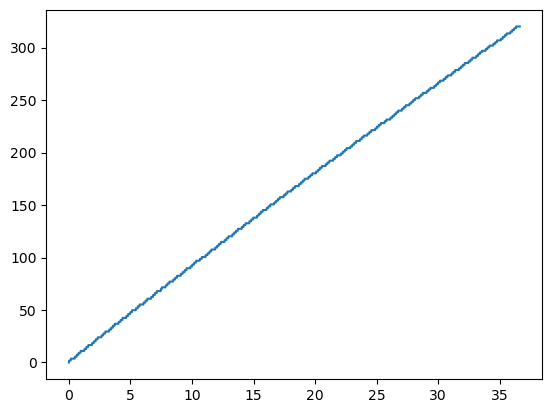

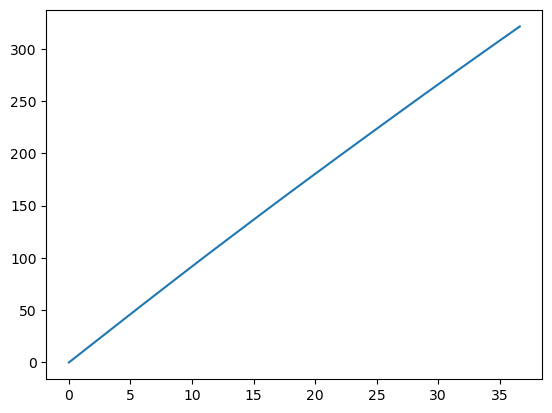

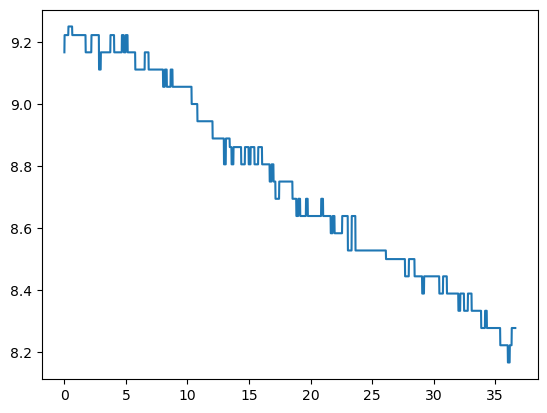

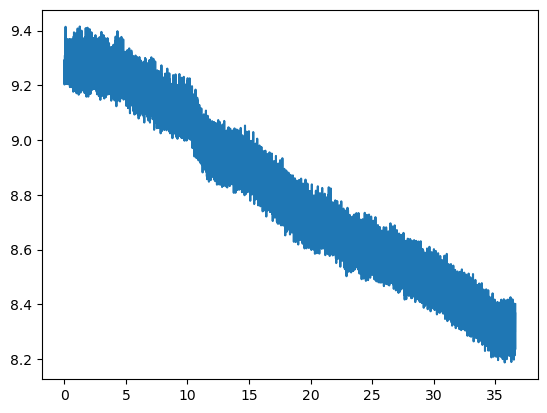

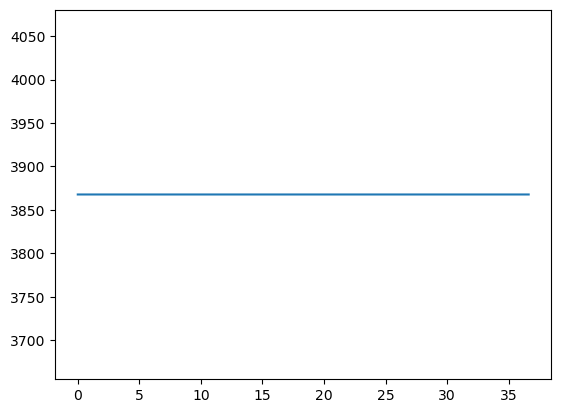

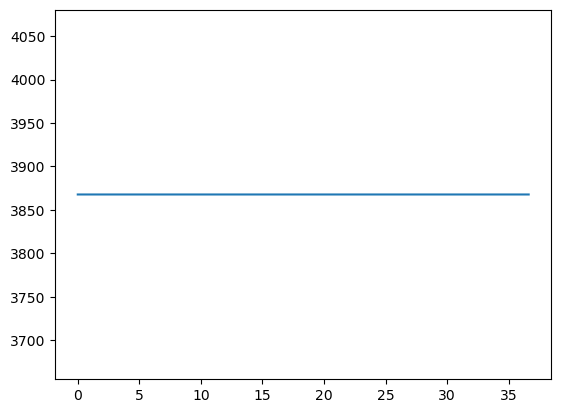

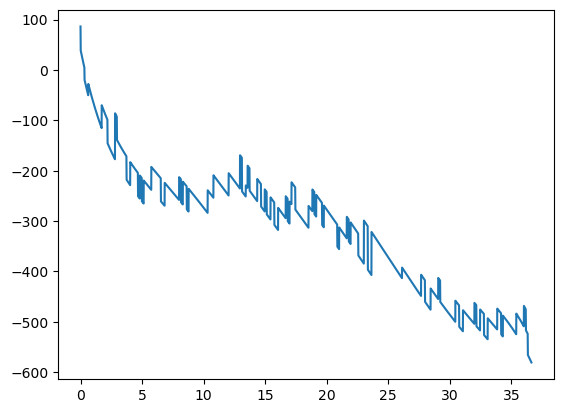

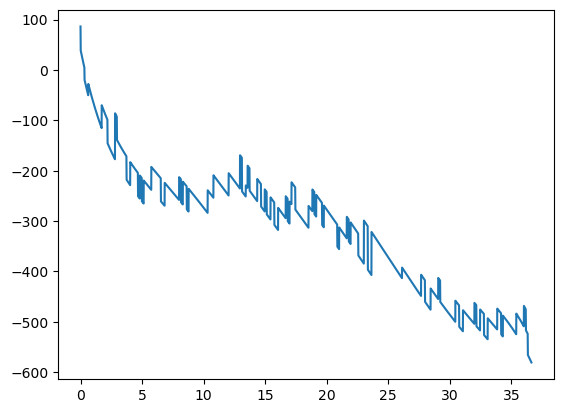

In [245]:
x = np.linspace(0,len(df_meetstuk),len(df_meetstuk))
plt.plot(df_meetstuk5["Dataloggertijd, in s"]-df_meetstuk5["Dataloggertijd, in s"].iloc[0], df_meetstuk5["Afgelegde afstand (m)"])
plt.figure()
plt.plot(df_meetstuk5["Dataloggertijd, in s"]-df_meetstuk5["Dataloggertijd, in s"].iloc[0], df_meetstuk5["Afgelegde afstand wiel (m)"])

plt.figure()
plt.plot(df_meetstuk5["Dataloggertijd, in s"]-df_meetstuk5["Dataloggertijd, in s"].iloc[0], df_meetstuk5["GPS speed, in m/s"])
plt.figure()
plt.plot(df_meetstuk5["Dataloggertijd, in s"]-df_meetstuk5["Dataloggertijd, in s"].iloc[0], df_meetstuk5["Wielsnelheid, in m/s"])


plt.figure()
plt.plot(df_meetstuk5["Dataloggertijd, in s"] - df_meetstuk5["Dataloggertijd, in s"].iloc[0],
         df_meetstuk5['Totale theoretische energie (J)'])
plt.figure()
plt.plot(df_meetstuk5["Dataloggertijd, in s"] - df_meetstuk5["Dataloggertijd, in s"].iloc[0],
         df_meetstuk5["Totale theoretische energie wiel (J)"])

plt.figure()
plt.plot(df_meetstuk5["Dataloggertijd, in s"] - df_meetstuk5["Dataloggertijd, in s"].iloc[0],
         df_meetstuk5['Energie verschil berekend en gemeten (J)'])
plt.figure()
plt.plot(df_meetstuk5["Dataloggertijd, in s"] - df_meetstuk5["Dataloggertijd, in s"].iloc[0],
         df_meetstuk5["Energie verschil berekend en gemeten wiel (J)"])

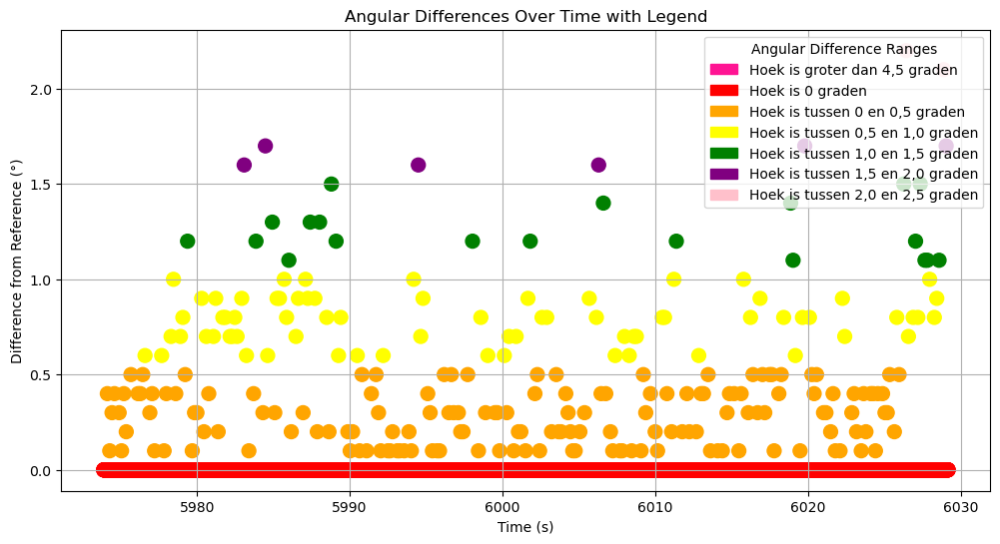

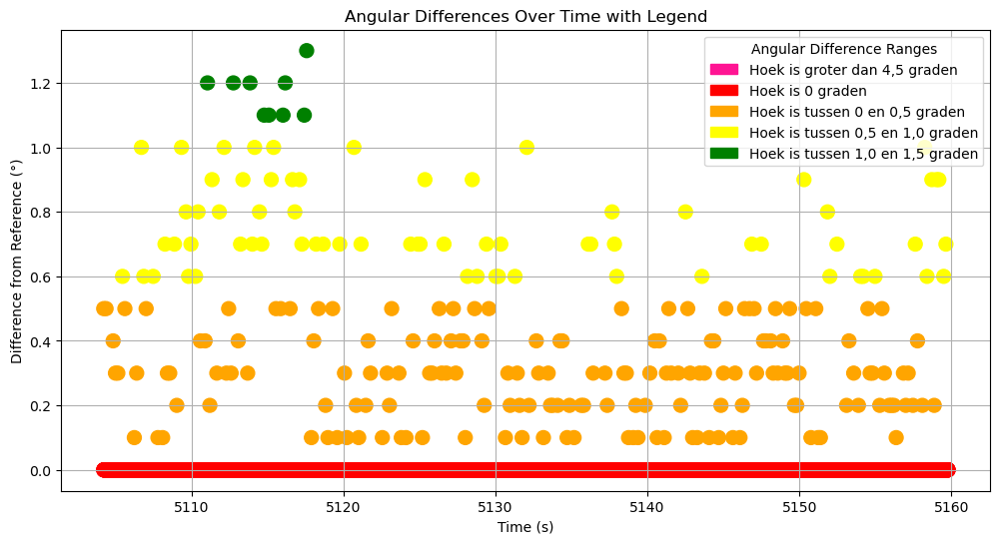

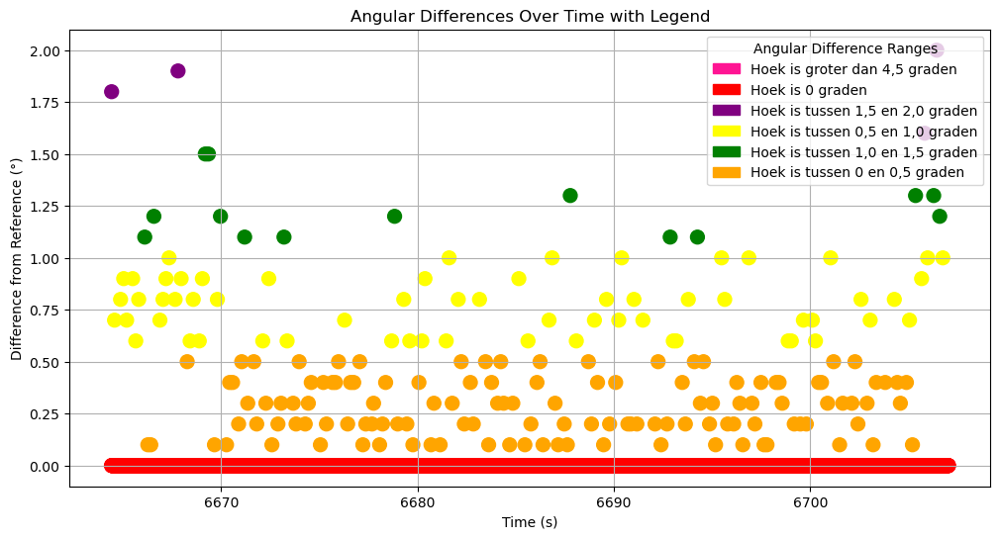

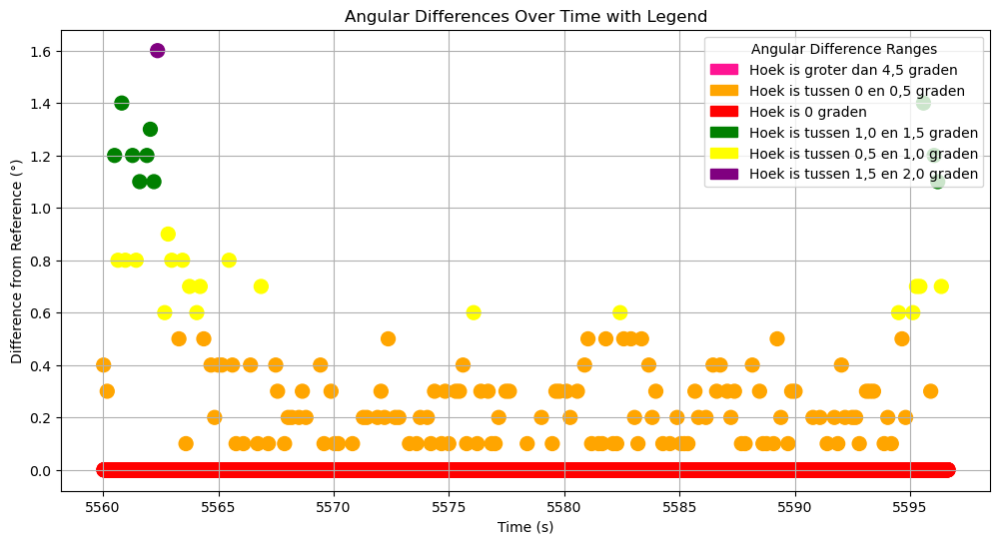

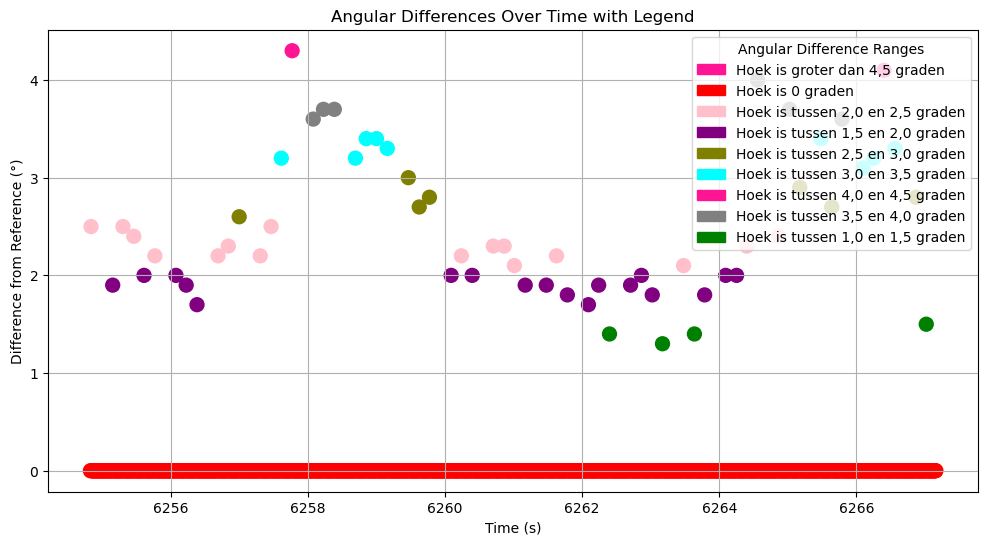

In [190]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

def plot_over_time_with_colors_and_legend(df, time_col, angular_col, color_col, label_col):
    """
    Plot angular differences over time with assigned colors and a legend using Matplotlib.

    Parameters:
        df (pd.DataFrame): DataFrame containing the data.
        time_col (str): Column representing time or sequential index.
        angular_col (str): Column for angular differences.
        color_col (str): Column containing color labels.
        label_col (str): Column containing labels for the legend.
    """
    plt.figure(figsize=(12, 6))

    # Scatter plot without edge colors
    plt.scatter(df[time_col], df[angular_col], c=df[color_col], s=100)

    # Create legend handles based on unique color-label pairs
    unique_labels = df[[color_col, label_col]].drop_duplicates()
    legend_handles = [mpatches.Patch(color=row[color_col], label=row[label_col])
                      for _, row in unique_labels.iterrows()]

    # Add legend to the plot
    plt.legend(handles=legend_handles, title="Angular Difference Ranges", loc='upper right')

    # Add plot styling
    plt.xlabel('Time (s)')
    plt.ylabel('Difference from Reference (°)')
    plt.title('Angular Differences Over Time with Legend')
    plt.grid(True)
    plt.show()

# Call the function for each dataset
plot_over_time_with_colors_and_legend(df_meetstuk,
                                      time_col='Dataloggertijd, in s',
                                      angular_col='Bearing (°)',
                                      color_col='Color',
                                      label_col='Label')

plot_over_time_with_colors_and_legend(df_meetstuk3,
                                      time_col='Dataloggertijd, in s',
                                      angular_col='Bearing (°)',
                                      color_col='Color',
                                      label_col='Label')

plot_over_time_with_colors_and_legend(df_meetstuk4,
                                      time_col='Dataloggertijd, in s',
                                      angular_col='Bearing (°)',
                                      color_col='Color',
                                      label_col='Label')

plot_over_time_with_colors_and_legend(df_meetstuk5,
                                      time_col='Dataloggertijd, in s',
                                      angular_col='Bearing (°)',
                                      color_col='Color',
                                      label_col='Label')

plot_over_time_with_colors_and_legend(df_meetstuk6,
                                      time_col='Dataloggertijd, in s',
                                      angular_col='Bearing (°)',
                                      color_col='Color',
                                      label_col='Label')


In [1]:
lib.plot_scatter((df_meetstuk,'afgelegde afstand (m)','Totale gemeten energie (GPS) (J)', 'Gemeten energie'),
                  (df_meetstuk, 'afgelegde afstand (m)', 'Totale theoretische energie (J)', 'berekende energie'))

NameError: name 'lib' is not defined

In [33]:
df_meetstuk

,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,Totale gemeten energie (GPS) (J),Energie verschil berekend en gemeten (J),delta energie berekend en gemeten (J),GPS afstand diff (m),Weerstand met GPS Snelheid (N),Afgelegde afstand (m),Angular Difference (°),Difference from Reference (°),Color,Label
0,5,5973.8667,03|04,2332.2251,0.722,-0.054,-0.0,129044,27.371,-0.014,...,4430.002951,0.000000,NaN,NaN,NaN,0.000000,NaN,6.7,orange,Hoek is tussen 0 en 15 graden
1,5,5973.8755,03|04,2332.2339,0.705,-0.055,-0.0,129044,27.371,-0.012,...,4429.541634,0.461317,0.461317,0.0,inf,0.000000,0.0,6.7,orange,Hoek is tussen 0 en 15 graden
2,5,5973.8842,03|04,2332.2427,0.688,-0.053,-0.0,129044,27.371,-0.015,...,4429.077750,0.925201,0.463884,0.0,inf,0.000000,0.0,6.7,orange,Hoek is tussen 0 en 15 graden
3,5,5973.8930,03|04,2332.2515,0.668,-0.055,-0.0,129044,27.372,-0.014,...,4428.611306,1.391645,0.466444,0.0,inf,0.000000,0.0,6.7,orange,Hoek is tussen 0 en 15 graden
4,5,5973.9018,03|04,2332.2603,0.650,-0.055,-0.0,129044,27.372,-0.014,...,4428.142311,1.860640,0.468995,0.0,inf,0.000000,0.0,6.7,orange,Hoek is tussen 0 en 15 graden
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6292,5,6029.1495,03|04,2387.4983,0.021,-0.079,-0.0,129044,30.269,-0.042,...,2102.052764,2327.950188,0.202132,0.0,inf,399.388139,0.0,63.6,black,Andere hoek
6293,5,6029.1583,03|04,2387.5071,0.020,-0.078,-0.0,129044,30.269,-0.042,...,2101.851206,2328.151746,0.201558,0.0,inf,399.388139,0.0,63.6,black,Andere hoek
6294,5,6029.1671,03|04,2387.5161,0.019,-0.078,-0.0,129044,30.269,-0.044,...,2101.650224,2328.352727,0.200981,0.0,inf,399.388139,0.0,63.6,black,Andere hoek
6295,5,6029.1759,03|04,2387.5249,0.019,-0.078,-0.0,129044,30.269,-0.039,...,2101.449822,2328.553130,0.200403,0.0,inf,399.388139,0.0,63.6,black,Andere hoek


In [206]:
import plotly.graph_objects as go

# Function to create scatter plots with an optional bar chart
def create_scatter_and_bar_plot(df, title, marker_symbol, bar_column, bar_title):
    """
    Create scatter plots and bar plots for a given DataFrame.

    Parameters:
        df (pd.DataFrame): The input DataFrame.
        title (str): The title of the scatter plot.
        marker_symbol (str): Marker symbol for the scatter plot.
        bar_column (str): Column to plot as bar chart.
        bar_title (str): Title of the bar chart.
    """
    fig = go.Figure()

    # Scatter Plot
    fig.add_trace(go.Scatter(
        x=df['Dataloggertijd, in s'],
        y=df['Weerstand met GPS Snelheid (N)'],
        mode='markers',
        marker=dict(
            symbol=marker_symbol,
            size=10,
            color=df['GPS speed, in km/h'],  # Color based on GPS speed
            colorscale='Viridis',
            colorbar=dict(title="Snelheid (km/h)")
        ),
        text=df['GPS speed, in km/h'],  # Tooltip
        hoverinfo='x+y+text',
        name='Weerstand vs Tijd'
    ))

    # Bar Chart
    fig.add_trace(go.Bar(
        x=df['Dataloggertijd, in s'],
        y=df[bar_column],
        name=bar_title,
        opacity=0.6,
        marker_color='rgba(200, 50, 100, 0.6)'  # Semi-transparent red bars
    ))

    # Layout settings
    fig.update_layout(
        title=title,
        xaxis_title='Dataloggertijd (s)',
        yaxis_title='Weerstand kracht (N)',
        yaxis=dict(range=[-30, 10]),
        barmode='overlay',  # Combine bar and scatter in one plot
        legend=dict(x=0.8, y=1.0),
        template="plotly_white"
    )

    fig.show()

# Call the function for multiple datasets
create_scatter_and_bar_plot(df_meetstuk,
                            title='Weerstand rechte stuk rechtsonder ronde 7',
                            marker_symbol='diamond',
                            bar_column='Weerstand met GPS Snelheid wiel (N)',
                            bar_title='Weerstand als staafdiagram')

create_scatter_and_bar_plot(df_meetstuk3,
                            title='Weerstand rechte stuk rechtsonder ronde 3',
                            marker_symbol='circle',
                            bar_column='Weerstand met GPS Snelheid wiel (N)',
                            bar_title='Weerstand als staafdiagram')

create_scatter_and_bar_plot(df_meetstuk4,
                            title='Weerstand rechte stuk rechtsonder ronde 10',
                            marker_symbol='square',
                            bar_column='Weerstand met GPS Snelheid wiel (N)',
                            bar_title='Weerstand als staafdiagram')

create_scatter_and_bar_plot(df_meetstuk5,
                            title='Weerstand rechte stuk rechtsonder ronde 5',
                            marker_symbol='triangle-up',
                            bar_column='Weerstand met GPS Snelheid wiel (N)',
                            bar_title='Weerstand als staafdiagram')

create_scatter_and_bar_plot(df_meetstuk6,
                            title='Weerstand bocht rechtsonder ronde 8',
                            marker_symbol='x',
                            bar_column='Weerstand met GPS Snelheid wiel (N)',
                            bar_title='Weerstand als staafdiagram')


KeyError: 'Weerstand met GPS Snelheid wiel (N)'

In [210]:
import plotly.graph_objects as go

# Function to create scatter plots with an optional bar chart
def create_scatter_and_bar_plot(df, title, marker_symbol, bar_column, bar_title):
    """
    Create scatter plots and bar plots for a given DataFrame.

    Parameters:
        df (pd.DataFrame): The input DataFrame.
        title (str): The title of the scatter plot.
        marker_symbol (str): Marker symbol for the scatter plot.
        bar_column (str): Column to plot as bar chart.
        bar_title (str): Title of the bar chart.
    """
    fig = go.Figure()

    # Scatter Plot
    fig.add_trace(go.Scatter(
        x=df['Dataloggertijd, in s'],
        y=df['Weerstand met GPS Snelheid wiel (N)']*-1,
        mode='markers',
        marker=dict(
            symbol=marker_symbol,
            size=10,
            color=df['GPS speed, in km/h'],  # Color based on GPS speed
            colorscale='Viridis',
            colorbar=dict(title="Snelheid (km/h)")
        ),
        text=df['GPS speed, in km/h'],  # Tooltip
        hoverinfo='x+y+text',
        name='Weerstand vs Tijd'
    ))

    # Bar Chart
    fig.add_trace(go.Bar(
        x=df['Dataloggertijd, in s'],
        y=df[bar_column],
        name=bar_title,
        opacity=0.6,
        marker_color='rgba(200, 50, 100, 0.6)'  # Semi-transparent red bars
    ))

    # Layout settings
    fig.update_layout(
        title=title,
        xaxis_title='Dataloggertijd (s)',
        yaxis_title='Weerstand kracht (N)',
        yaxis=dict(range=[0, 1]),
        barmode='overlay',  # Combine bar and scatter in one plot
        legend=dict(x=0.8, y=1.0),
        template="plotly_white"
    )

    fig.show()

# Call the function for multiple datasets
create_scatter_and_bar_plot(df_meetstuk,
                            title='Weerstand rechte stuk rechtsonder ronde 7',
                            marker_symbol='diamond',
                            bar_column='Weerstand met GPS Snelheid wiel (N)',
                            bar_title='Weerstand als staafdiagram')




In [204]:
# Call the function for multiple datasets
create_scatter_and_bar_plot(df_meetstuk,
                            title='Weerstand rechte stuk rechtsonder ronde 7',
                            marker_symbol='diamond',
                            bar_column='Weerstand met GPS Snelheid wiel (N)',
                            bar_title='Weerstand als staafdiagram')

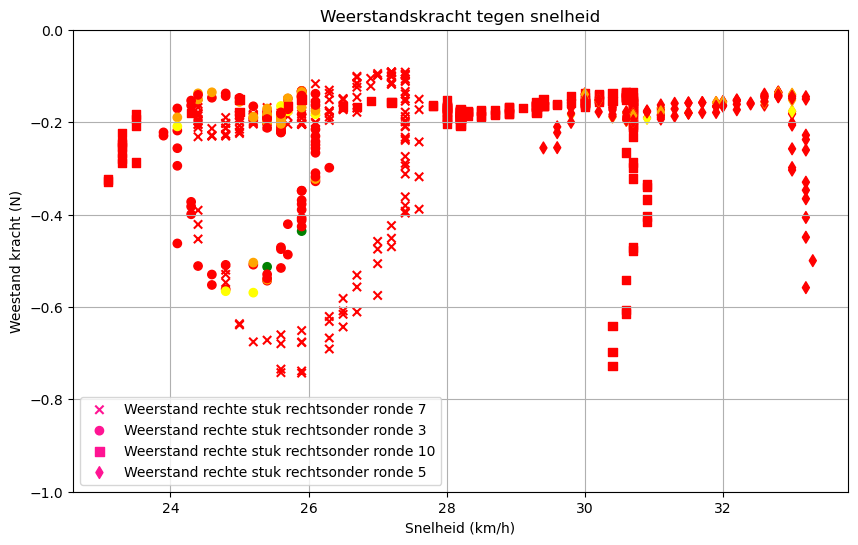

In [151]:
plt.figure(figsize=(10, 6))
plt.scatter(df_meetstuk['GPS speed, in km/h'],df_meetstuk['Weerstand met GPS Snelheid (N)'],label='Weerstand rechte stuk rechtsonder ronde 7',    c=df_meetstuk['Color'], marker = 'x')
#plt.scatter(df_meetstuk2['GPS speed, in km/h'],df_meetstuk2['Weerstand met GPS Snelheid (N)'], label='Weerstand rechte stuk linksboven ronde 7', color = 'b')
plt.scatter(df_meetstuk3['GPS speed, in km/h'],df_meetstuk3['Weerstand met GPS Snelheid (N)'], label='Weerstand rechte stuk rechtsonder ronde 3',c=df_meetstuk3['Color'], marker = 'o')
plt.scatter(df_meetstuk4['GPS speed, in km/h'],df_meetstuk4['Weerstand met GPS Snelheid (N)'], label='Weerstand rechte stuk rechtsonder ronde 10',c=df_meetstuk4['Color'], marker = 's')
plt.scatter(df_meetstuk5['GPS speed, in km/h'],df_meetstuk5['Weerstand met GPS Snelheid (N)'], label='Weerstand rechte stuk rechtsonder ronde 5',c=df_meetstuk5['Color'], marker = 'd')


plt.title('Weerstandskracht tegen snelheid')
plt.xlabel('Snelheid (km/h)')
plt.ylabel('Weestand kracht (N)')

# Stel de y-as limieten in
plt.ylim(-1, 0)
# plt.xlim(23.3, 28)

plt.legend()
plt.grid()
plt.show()

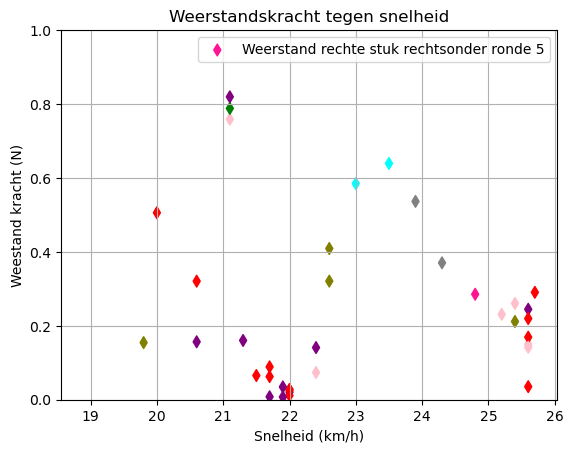

In [36]:
plt.scatter(df_meetstuk6['GPS speed, in km/h'],df_meetstuk6['Weerstand met GPS Snelheid (N)'], label='Weerstand rechte stuk rechtsonder ronde 5',c=df_meetstuk6['Color'], marker = 'd')

plt.title('Weerstandskracht tegen snelheid')
plt.xlabel('Snelheid (km/h)')
plt.ylabel('Weestand kracht (N)')
plt.ylim(0, 1)
# plt.xlim(23.3, 28)

plt.legend()
plt.grid()
plt.show()

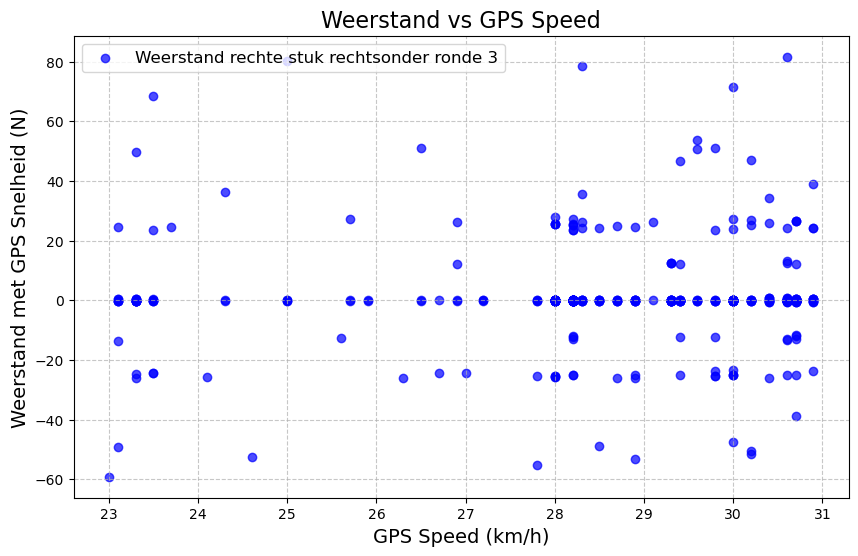

In [76]:
import matplotlib.pyplot as plt

# Controleer of de benodigde kolommen bestaan
if 'GPS speed, in km/h' in df_meetstuk4.columns and 'Weerstand met GPS Snelheid (N)' in df_meetstuk4.columns:
    # Verwijder rijen met ontbrekende waarden in de benodigde kolommen
    df_meetstuk4_cleaned = df_meetstuk4.dropna(subset=['GPS speed, in km/h', 'Weerstand met GPS Snelheid (N)'])
    
    if len(df_meetstuk4_cleaned) > 0:  # Controleer of er nog data over is na het verwijderen van NaN-waarden
        plt.figure(figsize=(10, 6))  # Pas de grootte van de figuur aan
        plt.scatter(
            df_meetstuk4_cleaned['GPS speed, in km/h'], 
            df_meetstuk4_cleaned['Weerstand met GPS Snelheid (N)'], 
            label='Weerstand rechte stuk rechtsonder ronde 3', 
            marker='o', 
            color='blue', 
            alpha=0.7  # Transparantie voor betere zichtbaarheid bij overlappende punten
        )
        plt.xlabel('GPS Speed (km/h)', fontsize=14)
        plt.ylabel('Weerstand met GPS Snelheid (N)', fontsize=14)
        plt.title('Weerstand vs GPS Speed', fontsize=16)
        plt.legend(loc='upper left', fontsize=12)  # Pas de positie en grootte van de legenda aan
        plt.grid(visible=True, linestyle='--', alpha=0.7)
        plt.show()
    else:
        print("Geen gegevens over na het verwijderen van ontbrekende waarden.")
else:
    print("Een of beide kolommen ('GPS speed, in km/h', 'Weerstand met GPS Snelheid (N)') ontbreken in df_meetstuk3.")


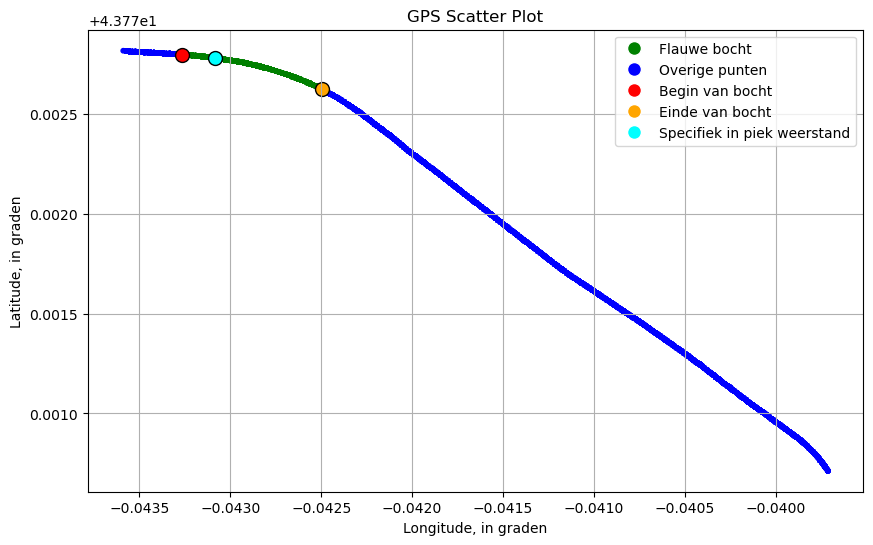

In [108]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, HTMLWriter
import pandas as pd

# Assuming 'df_e_kin' and 'filtered_motordriver' are your dataframes and correctly loaded with data

# Convert speeds to m/s
df_e_kin['Speed_m/s'] = df_e_kin['Gemeten_snelheden_GPS (m/s)']

# Remove rows where acceleration, speed, or resistance is NaN or infinite
df_e_kin = df_e_kin.replace([np.inf, -np.inf], np.nan)  # Replace inf/-inf with NaN
df_e_kin = df_e_kin.dropna(subset=['Speed_m/s', 'Weerstand (N)'])  # Drop rows with NaN in these columns

# Filter data for resistance between 0 and 20 N
df_e_kin = df_e_kin[(df_e_kin['Weerstand (N)'] >= 0) & (df_e_kin['Weerstand (N)'] <= 20)]

# Prepare the figure for plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Setup for GPS data plot
ax1.set_xlim(rechte_stuk_ronde7['GPS longitude, in graden'].min() - 0.0001, rechte_stuk_ronde7['GPS longitude, in graden'].max() + 0.0001)
ax1.set_ylim(rechte_stuk_ronde7['GPS latitude, in graden'].min() - 0.0001, rechte_stuk_ronde7['GPS latitude, in graden'].max() + 0.0001)
ax1.set_xlabel("Longitude")
ax1.set_ylabel("Latitude")
ax1.set_title("GPS Tracking (Single Color)")

# Setup for resistance vs speed plot
ax2.set_xlim(df_e_kin['Speed_m/s'].min() - 1, df_e_kin['Speed_m/s'].max() + 1)
ax2.set_ylim(df_e_kin['Weerstand (N)'].min() - 5, df_e_kin['Weerstand (N)'].max() + 5)
ax2.set_xlabel("Speed (m/s)")
ax2.set_ylabel("Resistance (N)")
ax2.set_title("Resistance vs Speed (Single Color)")

# Initialize scatter plots
scat1 = ax1.scatter([], [], color='blue', alpha=0.7)
scat2 = ax2.scatter([], [], color='blue', alpha=0.7)

# Add a legend for acceleration categories
legend_labels = [
    ('red', 'Voor bocht'),
    ('blue', 'In bocht'),
    ('yellow', 'Na bocht')
]
for color, label in legend_labels:
    ax2.scatter([], [], color=color, label=label)  # Dummy points for legend
ax2.legend(title="Kleurenlegenda", loc='upper left')

# Define the update function for the animation
def update(frame):
    end = frame + 1  # Display one additional row per frame
    if end > len(df_e_kin):  # Stop when all data is shown
        return

    # Extract data chunk
    chunk = df_e_kin.iloc[:end]  # Include all data up to the current frame

    colors = chunk.index.map(
    lambda i: 'red' if i < 389106 else ('blue' if i <= 390200 else 'yellow'))
    
    # Update the GPS plot
    chunk_lat = rechte_stuk_ronde7.iloc[:end]['GPS latitude, in graden']
    chunk_lon = rechte_stuk_ronde7.iloc[:end]['GPS longitude, in graden']
    scat1.set_offsets(np.column_stack((chunk_lon, chunk_lat)))
    
    # Update the resistance vs speed plot
    scat2.set_offsets(np.column_stack((chunk['Speed_m/s'], chunk['Weerstand (N)'])))

# Animation settings
frames_count = max(len(rechte_stuk_ronde7), len(df_e_kin))
anim = FuncAnimation(fig, update, frames=frames_count, repeat=False, interval=100)  # Adjust the interval as needed

# Save as HTML file
output_path = "dynamic_tracking_single_color.html"
html_writer = HTMLWriter()
anim.save(output_path, writer=html_writer)

print(f"Animation saved as {output_path}.")


ValueError: Kolom Gemeten_snelheden_GPS (m/s) ontbreekt in df_meetstuk.

Animatie opgeslagen als dynamic_tracking_single_color_bocht.html.


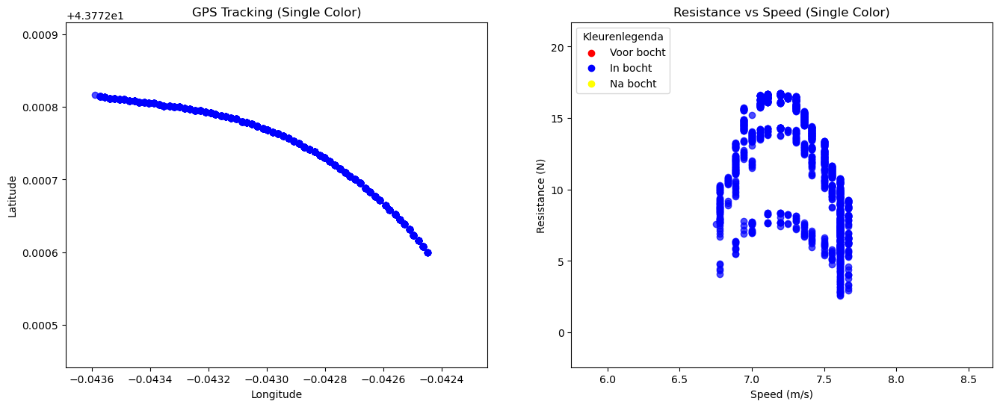

In [39]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, HTMLWriter
import pandas as pd

# Veronderstel dat 'df_e_kin' en 'rechte_stuk_ronde7' correct zijn geladen met de benodigde data

# Filter de dataframes op de gewenste indexrange
start_index = 388561
end_index = 390200

df_e_kin_filtered = df_e_kin.loc[start_index:end_index].copy()
rechte_stuk_ronde7_filtered = rechte_stuk_ronde7.loc[start_index:end_index].copy()

# Converteer snelheden naar m/s
df_e_kin_filtered['Speed_m/s'] = df_e_kin_filtered['Gemeten_snelheden_GPS (m/s)']

# Verwijder rijen waar snelheid of weerstand NaN of oneindig is
df_e_kin_filtered = df_e_kin_filtered.replace([np.inf, -np.inf], np.nan)
df_e_kin_filtered = df_e_kin_filtered.dropna(subset=['Speed_m/s', 'Weerstand (N)'])

# Filter data voor weerstand tussen 0 en 20 N
df_e_kin_filtered = df_e_kin_filtered[(df_e_kin_filtered['Weerstand (N)'] >= 0) & (df_e_kin_filtered['Weerstand (N)'] <= 20)]

# Bereid de figuur voor om te plotten
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Instellingen voor GPS-gegevensplot
ax1.set_xlim(rechte_stuk_ronde7_filtered['GPS longitude, in graden'].min() - 0.0001,
             rechte_stuk_ronde7_filtered['GPS longitude, in graden'].max() + 0.0001)
ax1.set_ylim(rechte_stuk_ronde7_filtered['GPS latitude, in graden'].min() - 0.0001,
             rechte_stuk_ronde7_filtered['GPS latitude, in graden'].max() + 0.0001)
ax1.set_xlabel("Longitude")
ax1.set_ylabel("Latitude")
ax1.set_title("GPS Tracking (Single Color)")

# Instellingen voor weerstand versus snelheid plot
ax2.set_xlim(df_e_kin_filtered['Speed_m/s'].min() - 1, df_e_kin_filtered['Speed_m/s'].max() + 1)
ax2.set_ylim(df_e_kin_filtered['Weerstand (N)'].min() - 5, df_e_kin_filtered['Weerstand (N)'].max() + 5)
ax2.set_xlabel("Speed (m/s)")
ax2.set_ylabel("Resistance (N)")
ax2.set_title("Resistance vs Speed (Single Color)")

# Initialiseer scatter plots met lege numpy-arrays
scat1 = ax1.scatter([], [], color='blue', alpha=0.7, animated=True)
scat2 = ax2.scatter([], [], color='blue', alpha=0.7, animated=True)

# Voeg een legenda toe voor acceleratiecategorieën
legend_labels = [
    ('red', 'Voor bocht'),
    ('blue', 'In bocht'),
    ('yellow', 'Na bocht')
]
for color, label in legend_labels:
    ax2.scatter([], [], color=color, label=label)  # Dummy punten voor legenda
ax2.legend(title="Kleurenlegenda", loc='upper left')

# Definieer de initialisatiefunctie voor de animatie
def init():
    scat1.set_offsets(np.empty((0, 2)))
    scat2.set_offsets(np.empty((0, 2)))
    return scat1, scat2

# Definieer de updatefunctie voor de animatie
def update(frame):
    end = frame + 1  # Toon één extra rij per frame
    if end > len(df_e_kin_filtered):  # Stop wanneer alle data is weergegeven
        return scat1, scat2

    # Haal data op tot het huidige frame
    chunk = df_e_kin_filtered.iloc[:end]

    # Update de GPS-plot
    chunk_lat = rechte_stuk_ronde7_filtered.iloc[:end]['GPS latitude, in graden']
    chunk_lon = rechte_stuk_ronde7_filtered.iloc[:end]['GPS longitude, in graden']
    scat1.set_offsets(np.column_stack((chunk_lon, chunk_lat)))

    # Update de weerstand versus snelheid plot
    scat2.set_offsets(np.column_stack((chunk['Speed_m/s'], chunk['Weerstand (N)'])))

    return scat1, scat2

# Animatie-instellingen
frames_count = len(df_e_kin_filtered)
anim = FuncAnimation(fig, update, frames=frames_count, init_func=init, repeat=False, interval=50, blit=True)

# Sla op als MP4-bestand
output_path = "dynamic_tracking_single_color_bocht.html"
html_writer = HTMLWriter()
anim.save(output_path, writer=html_writer, dpi=80)

print(f"Animatie opgeslagen als {output_path}.")


In [31]:
# Voeg de kolommen van df_e_kin_filtered toe aan rechte_stuk_ronde7_filtered
df_combined = pd.concat([rechte_stuk_ronde7, df_e_kin], axis=1)

# Bekijk het gecombineerde dataframe
df_combined

,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,Totale Energie met GPS snelheid (J),Totale theoretische Energie met GPS snelheid (J),Energie vershil met GPS snelheid (J),Totale theoretische energie (J),Energie vershil (J),delta energie met GPS snelheid (J),delta afstand,delta energie (J),Weerstand met GPS Snelheid (N),Weerstand (N)
388561,5,5973.7964,03|04,2332.1548,0.848,-0.051,-0.0,129044,27.362,-0.010,...,6773.295020,6824.232520,50.937500,6815.870023,0.000000,NaN,NaN,NaN,NaN,NaN
388562,5,5973.8052,03|04,2332.1636,0.830,-0.049,-0.0,129044,27.363,-0.009,...,6773.295020,6824.687218,51.392198,6816.324721,-15.260052,0.454698,0.06,-15.260052,7.578293,7.578293
388563,5,5973.8140,03|04,2332.1724,0.812,-0.051,-0.0,129044,27.364,-0.014,...,6789.750045,6824.689797,34.939753,6816.327301,-12.065553,-16.452445,0.07,3.194499,-235.034929,-235.034929
388564,5,5973.8228,03|04,2332.1812,0.797,-0.051,-0.0,129044,27.366,-0.009,...,6789.292767,6824.692369,35.399602,6816.329872,-16.054593,0.459849,0.06,-3.989040,7.664150,7.664150
388565,5,5973.8315,03|04,2332.1899,0.783,-0.050,-0.0,129044,27.368,-0.006,...,6788.832918,6824.694933,35.862015,6816.332436,-24.160930,0.462413,0.06,-8.106337,7.706883,7.706883
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
394861,5,6029.1495,03|04,2387.4983,0.021,-0.079,-0.0,129044,30.269,-0.042,...,4463.739433,6824.433317,2360.693883,6816.070820,2386.867467,0.200797,0.12,114.577047,1.673306,1.673306
394862,5,6029.1583,03|04,2387.5071,0.020,-0.078,-0.0,129044,30.269,-0.042,...,4463.538637,6824.432738,2360.894101,6816.070241,2277.040480,0.200218,0.00,-109.826987,inf,inf
394863,5,6029.1671,03|04,2387.5161,0.019,-0.078,-0.0,129044,30.269,-0.044,...,4463.338419,6824.432157,2361.093738,6816.069660,2392.177686,0.199637,0.12,115.137206,1.663641,1.663641
394864,5,6029.1759,03|04,2387.5249,0.019,-0.078,-0.0,129044,30.269,-0.039,...,4463.138782,6824.431574,2361.292792,6816.069077,2284.562208,0.199054,0.00,-107.615478,inf,inf


In [69]:
df_combined

,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),Stroom door de ingang van motordriver (A),...,Totale Energie met GPS snelheid (J),Totale theoretische Energie met GPS snelheid (J),Energie vershil met GPS snelheid (J),Totale theoretische energie (J),Energie vershil (J),delta energie met GPS snelheid (J),delta afstand,delta energie (J),Weerstand met GPS Snelheid (N),Weerstand (N)
388561,5,5973.7964,03|04,2332.1548,0.848,-0.051,-0.0,129044,27.362,-0.010,...,6773.295020,6824.232520,50.937500,6815.870023,0.000000,NaN,NaN,NaN,NaN,NaN
388562,5,5973.8052,03|04,2332.1636,0.830,-0.049,-0.0,129044,27.363,-0.009,...,6773.295020,6824.687218,51.392198,6816.324721,-15.260052,0.454698,0.06,-15.260052,7.578293,7.578293
388563,5,5973.8140,03|04,2332.1724,0.812,-0.051,-0.0,129044,27.364,-0.014,...,6789.750045,6824.689797,34.939753,6816.327301,-12.065553,-16.452445,0.07,3.194499,-235.034929,-235.034929
388564,5,5973.8228,03|04,2332.1812,0.797,-0.051,-0.0,129044,27.366,-0.009,...,6789.292767,6824.692369,35.399602,6816.329872,-16.054593,0.459849,0.06,-3.989040,7.664150,7.664150
388565,5,5973.8315,03|04,2332.1899,0.783,-0.050,-0.0,129044,27.368,-0.006,...,6788.832918,6824.694933,35.862015,6816.332436,-24.160930,0.462413,0.06,-8.106337,7.706883,7.706883
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
394861,5,6029.1495,03|04,2387.4983,0.021,-0.079,-0.0,129044,30.269,-0.042,...,4463.739433,6824.433317,2360.693883,6816.070820,2386.867467,0.200797,0.12,114.577047,1.673306,1.673306
394862,5,6029.1583,03|04,2387.5071,0.020,-0.078,-0.0,129044,30.269,-0.042,...,4463.538637,6824.432738,2360.894101,6816.070241,2277.040480,0.200218,0.00,-109.826987,inf,inf
394863,5,6029.1671,03|04,2387.5161,0.019,-0.078,-0.0,129044,30.269,-0.044,...,4463.338419,6824.432157,2361.093738,6816.069660,2392.177686,0.199637,0.12,115.137206,1.663641,1.663641
394864,5,6029.1759,03|04,2387.5249,0.019,-0.078,-0.0,129044,30.269,-0.039,...,4463.138782,6824.431574,2361.292792,6816.069077,2284.562208,0.199054,0.00,-107.615478,inf,inf


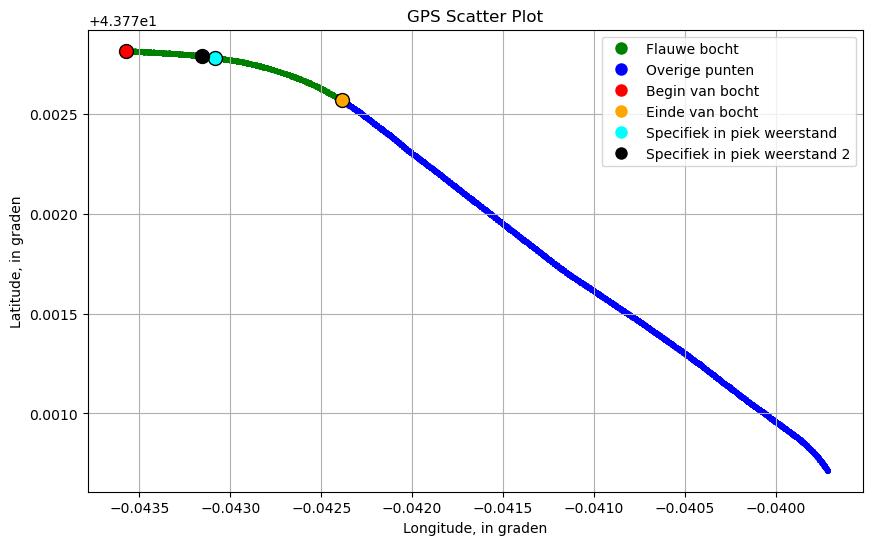

In [124]:
import matplotlib.pyplot as plt

# Stel de DataFrame opnieuw samen voor het rechte stuk
rechte_stuk_ronde7 = filtered_motordriver.loc[388561:394865]

# Bereid een kleurenarray voor alle punten, standaard ingesteld op blauw
colors = ['blue'] * len(rechte_stuk_ronde7)

# Vind de indices van de specifieke punten en zet de kleur naar groen
special_indices = [388565,390150]
index_positions = [rechte_stuk_ronde7.index.get_loc(idx) for idx in special_indices if idx in rechte_stuk_ronde7.index]

# Als beide indices gevonden zijn, kleur alle punten tussen deze indices groen
if len(index_positions) == 2:
    start_pos, end_pos = sorted(index_positions)  # Zorg ervoor dat start_pos < end_pos
    for i in range(start_pos, end_pos + 1):
        colors[i] = 'green'
    # Zet de eerste waarde op rood en de laatste op oranje
    colors[start_pos] = 'red'
    colors[end_pos] = 'orange'

# Specifiek punt op rij 389221 instellen op cyan
if 389221 in rechte_stuk_ronde7.index:
    cyan_pos = rechte_stuk_ronde7.index.get_loc(389221)
    colors[cyan_pos] = 'cyan'
    
if 389141 in rechte_stuk_ronde7.index:
    black_pos = rechte_stuk_ronde7.index.get_loc(389141)
    colors[black_pos] = 'black'

# Maak de scatter plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    rechte_stuk_ronde7['GPS longitude, in graden'],
    rechte_stuk_ronde7['GPS latitude, in graden'],
    color=colors,
    s=10  # Standaard grootte van de punten
)

# Extra's toevoegen
plt.title('GPS Scatter Plot')
plt.xlabel('Longitude, in graden')
plt.ylabel('Latitude, in graden')
plt.grid(True)

# Vergroot de grootte van de speciale punten (rood, oranje en cyan) voor betere zichtbaarheid
for i in [start_pos, end_pos, cyan_pos, black_pos]:
    plt.scatter(
        rechte_stuk_ronde7.iloc[i]['GPS longitude, in graden'],
        rechte_stuk_ronde7.iloc[i]['GPS latitude, in graden'],
        color=colors[i],
        s=100,  # Grotere grootte voor de speciale punten
        edgecolor='black'  # Voeg een rand toe voor betere zichtbaarheid
    )

# Legenda toevoegen
green_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='green', markersize=10, label='Flauwe bocht')
blue_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='Overige punten')
red_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10, label='Begin van bocht')
orange_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='orange', markersize=10, label='Einde van bocht')
cyan_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='cyan', markersize=10, label='Specifiek in piek weerstand')
black_patch = plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='black', markersize=10, label='Specifiek in piek weerstand 2')
plt.legend(handles=[green_patch, blue_patch, red_patch, orange_patch, cyan_patch, black_patch])

# Toon de plot
plt.show()


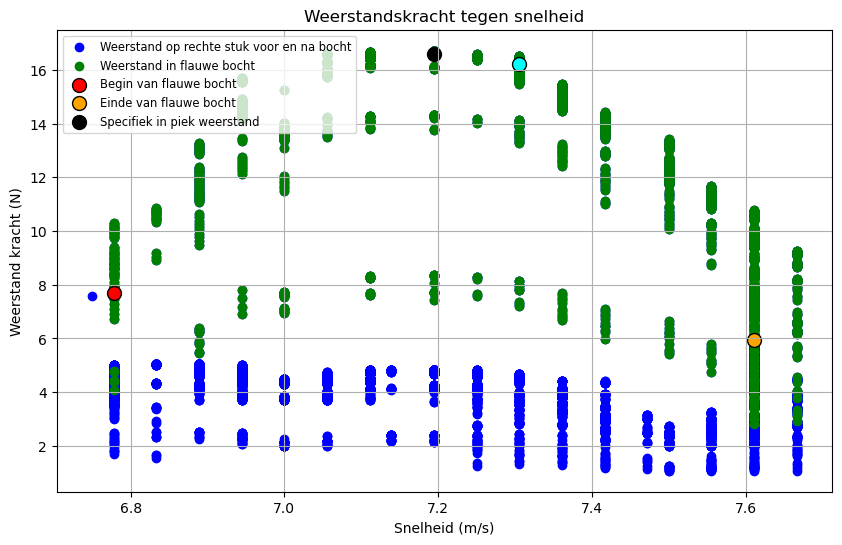

In [123]:
import matplotlib.pyplot as plt
#Met GPS snelheid

df_e_kin = df_e_kin[(df_combined['Weerstand (N)'] >= 0) & (df_combined['Weerstand (N)'] <= 20)]
df_e_kin = df_e_kin[(df_combined['Weerstand met GPS Snelheid (N)'] >= 0) & (df_combined['Weerstand met GPS Snelheid (N)'] <= 20)]

# Eerst, laten we de data voor de specifieke index range voorbereiden
specifieke_indices = df_combined.loc[388565:390150]

plt.figure(figsize=(10, 6))

# Teken alle punten in blauw
plt.scatter(df_combined["Gemeten_snelheden_GPS (m/s)"], df_combined['Weerstand (N)'],
            label='Weerstand op rechte stuk voor en na bocht', color='b')

# Teken nu de specifieke punten in het groen
plt.scatter(specifieke_indices["Gemeten_snelheden_GPS (m/s)"], specifieke_indices['Weerstand (N)'],
            color='green', label='Weerstand in flauwe bocht')

# Markeer het beginpunt met rood
plt.scatter(df_combined.loc[388565, "Gemeten_snelheden_GPS (m/s)"], df_combined.loc[388565, 'Weerstand (N)'],
            color='red', label='Begin van flauwe bocht', s=100, edgecolor='black')

# Markeer het eindpunt met oranje
plt.scatter(df_combined.loc[390150, "Gemeten_snelheden_GPS (m/s)"], df_combined.loc[390150, 'Weerstand (N)'],
            color='orange', label='Einde van flauwe bocht', s=100, edgecolor='black')

# Markeer een ander specifiek punt met cyan
plt.scatter(df_combined.loc[389221, "Gemeten_snelheden_GPS (m/s)"], df_combined.loc[389221, 'Weerstand (N)'],
            color='cyan', label='Specifiek in piek weerstand', s=100, edgecolor='black')

plt.scatter(df_combined.loc[389141, "Gemeten_snelheden_GPS (m/s)"], df_combined.loc[389141, 'Weerstand (N)'],
            color='black', label='Specifiek in piek weerstand', s=100, edgecolor='black')



plt.title('Weerstandskracht tegen snelheid')
plt.xlabel('Snelheid (m/s)')
plt.ylabel('Weerstand kracht (N)')
plt.grid(True)

# We passen de legenda aan zodat elk label maar één keer verschijnt
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Verwijder duplicaten

# Pas de legenda aan: kleinere lettergrootte en plaatsing linksboven
plt.legend(by_label.values(), by_label.keys(), loc='upper left', fontsize='small')

plt.show()


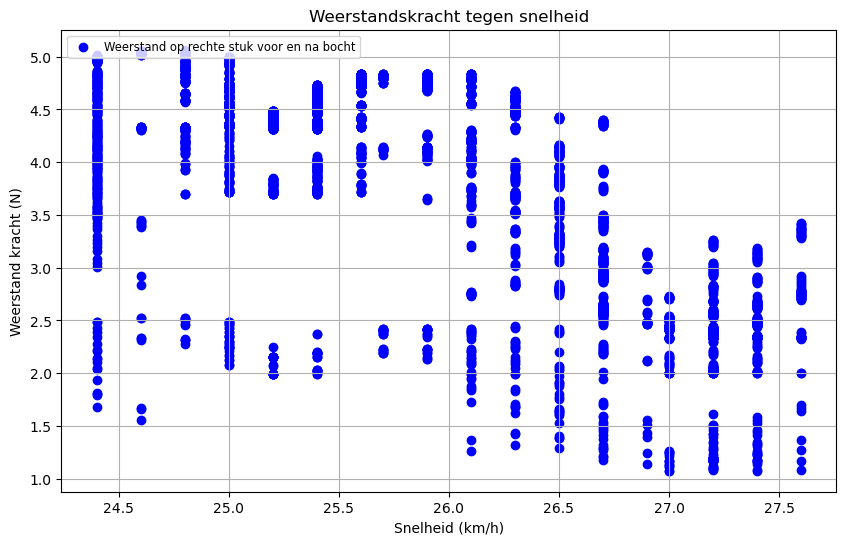

In [134]:
import matplotlib.pyplot as plt
#Met GPS snelheid

df_e_kin = df_e_kin[(df_e_kin['Weerstand (N)'] >= 0) & (df_e_kin['Weerstand (N)'] <= 20)]
df_e_kin = df_e_kin[(df_e_kin['Weerstand met GPS Snelheid (N)'] >= 0) & (df_e_kin['Weerstand met GPS Snelheid (N)'] <= 20)]

df_rechte_stuk = df_e_kin.loc[390500:]

# Eerst, laten we de data voor de specifieke index range voorbereiden
specifieke_indices = df_e_kin.loc[388565:390150]

plt.figure(figsize=(10, 6))

# Teken alle punten in blauw
plt.scatter(df_rechte_stuk["Gemeten_snelheden_GPS (m/s)"]*3.6, df_rechte_stuk['Weerstand (N)'],
            label='Weerstand op rechte stuk voor en na bocht', color='b')

# # Teken nu de specifieke punten in het groen
# plt.scatter(specifieke_indices["Gemeten_snelheden_GPS (m/s)"], specifieke_indices['Weerstand (N)'],
#             color='green', label='Weerstand in flauwe bocht')
# 
# # Markeer het beginpunt met rood
# plt.scatter(df_e_kin.loc[388565, "Gemeten_snelheden_GPS (m/s)"], df_e_kin.loc[388565, 'Weerstand (N)'],
#             color='red', label='Begin van flauwe bocht', s=100, edgecolor='black')
# 
# # Markeer het eindpunt met oranje
# plt.scatter(df_e_kin.loc[390150, "Gemeten_snelheden_GPS (m/s)"], df_e_kin.loc[390150, 'Weerstand (N)'],
#             color='orange', label='Einde van flauwe bocht', s=100, edgecolor='black')
# 
# # Markeer een ander specifiek punt met cyan
# plt.scatter(df_e_kin.loc[389221, "Gemeten_snelheden_GPS (m/s)"], df_e_kin.loc[389221, 'Weerstand (N)'],
#             color='cyan', label='Specifiek in piek weerstand', s=100, edgecolor='black')
# 
# plt.scatter(df_e_kin.loc[389141, "Gemeten_snelheden_GPS (m/s)"], df_e_kin.loc[389141, 'Weerstand (N)'],
#             color='black', label='Specifiek in piek weerstand', s=100, edgecolor='black')



plt.title('Weerstandskracht tegen snelheid')
plt.xlabel('Snelheid (km/h)')
plt.ylabel('Weerstand kracht (N)')
plt.grid(True)

# We passen de legenda aan zodat elk label maar één keer verschijnt
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Verwijder duplicaten

# Pas de legenda aan: kleinere lettergrootte en plaatsing linksboven
plt.legend(by_label.values(), by_label.keys(), loc='upper left', fontsize='small')

plt.show()


In [129]:
df_e_kin

,Afgelegde afstand (m),Gemeten_snelheden_GPS (m/s),Gemeten Snelheid (m/s),Kinetische Energie (J),Kinetische Energie met GPS snelheid (J),Potentiële Energie Totaal (J),Totale Energie (J),Totale Energie met GPS snelheid (J),Totale theoretische Energie met GPS snelheid (J),Energie vershil met GPS snelheid (J),Totale theoretische energie (J),Energie vershil (J),delta energie met GPS snelheid (J),delta afstand,delta energie (J),Weerstand met GPS Snelheid (N),Weerstand (N)
388562,10512.22,6.750000,6.845278,2108.602253,2050.312500,4722.982520,6831.584773,6773.295020,6824.687218,51.392198,6816.324721,-15.260052,0.454698,0.06,-15.260052,7.578293,7.578293
388564,10512.35,6.777778,6.848056,2110.313920,2067.222222,4722.070545,6832.384465,6789.292767,6824.692369,35.399602,6816.329872,-16.054593,0.459849,0.06,-3.989040,7.664150,7.664150
388565,10512.41,6.777778,6.861944,2118.882670,2067.222222,4721.610696,6840.493366,6788.832918,6824.694933,35.862015,6816.332436,-24.160930,0.462413,0.06,-8.106337,7.706883,7.706883
388566,10512.47,6.777778,6.845833,2108.944531,2067.222222,4721.148283,6830.092814,6788.370505,6824.697489,36.326984,6816.334993,-13.757822,0.464969,0.06,10.403108,7.749487,7.749487
388567,10512.53,6.777778,6.888611,2135.383337,2067.222222,4720.683314,6856.066651,6787.905536,6824.700038,36.794502,6816.337541,-39.729110,0.467518,0.06,-25.971288,7.791962,7.791962
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
394857,10914.23,6.833333,6.787500,2073.157031,2101.250000,2363.298364,4436.455395,4464.548364,6824.435610,2359.887246,6816.073113,2379.617718,0.203090,0.06,91.286184,3.384831,3.384831
394859,10914.36,6.833333,6.790556,2075.024014,2101.250000,2362.892754,4437.916768,4464.142754,6824.434468,2360.291713,6816.071971,2378.155203,0.201948,0.13,93.060465,1.553444,1.553444
394861,10914.48,6.833333,6.776944,2066.713920,2101.250000,2362.489433,4429.203353,4463.739433,6824.433317,2360.693883,6816.070820,2386.867467,0.200797,0.12,114.577047,1.673306,1.673306
394863,10914.60,6.833333,6.768889,2061.803556,2101.250000,2362.088419,4423.891974,4463.338419,6824.432157,2361.093738,6816.069660,2392.177686,0.199637,0.12,115.137206,1.663641,1.663641


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation


# Remove rows where acceleration, speed, or resistance is NaN or infinite
df_combined = df_combined[(df_combined['Weerstand (N)'] >= 0) & (df_combined['Weerstand (N)'] <= 20)]
df_combined = df_combined[(df_combined['Weerstand met GPS Snelheid (N)'] >= 0) & (df_combined['Weerstand met GPS Snelheid (N)'] <= 20)]
df_combined = df_combined.replace([np.inf, -np.inf], np.nan)  # Replace inf/-inf with NaN
df_combined = df_combined.dropna(subset=['Weerstand met GPS Snelheid (N)', 'Weerstand (N)'])  # Drop rows with NaN in these columns

# Prepare the figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Set up the latitude-longitude plot
ax1.set_ylim(df_combined['GPS latitude, in graden'].min() - 0.00001, df_combined['GPS latitude, in graden'].max() + 0.0001)
ax1.set_xlim(df_combined['GPS longitude, in graden'].min() - 0.00001, df_combined['GPS longitude, in graden'].max() + 0.00001)
ax1.set_xlabel("Latitude")
ax1.set_ylabel("Longitude")
ax1.set_title("Latitude and Longitude with Acceleration Coloring")

# Set up the speed comparison plot
ax2.set_xlim(df_combined['GPS speed, in km/h'].min() - 1, 
             df_combined['GPS speed, in km/h'].max() + 1)
ax2.set_ylim(df_combined['Weerstand met GPS Snelheid (N)'].min() - 5, 
             df_combined['Weerstand met GPS Snelheid (N)'].max() + 5)
ax2.set_xlabel("GPS speed, in km/h")
ax2.set_ylabel("Weerstand met GPS Snelheid (N)")
ax2.set_title("Weerstand tegen snelheid")

# Initialize scatter plots
scat1 = ax1.scatter([], [], alpha=0.7)
scat2 = ax2.scatter([], [], alpha=0.7)

# Add a legend for acceleration categories
legend_labels = [
    ('red', 'Voor bocht'),
    ('blue', 'In bocht'),
    ('yellow', 'Na bocht')
]
for color, label in legend_labels:
    ax2.scatter([], [], color=color, label=label)  # Dummy points for legend
ax2.legend(title="Kleurenlegenda", loc='upper left')

# Define the update function
def update(frame):
    end = frame + 1  # Display one additional row per frame
    if end > len(df_combined):  # Stop when all data is shown
        return

    # Extract data chunk
    chunk = df_combined.iloc[:end]  # Include all data up to the current frame
    
    # Determine colors for acceleration
    colors = chunk.index.map(
    lambda i: 'red' if i < 388565 else ('blue' if i <= 390150 else 'yellow'))

    # Update the latitude-longitude scatter plot
    # Update de GPS-plot
    chunk_lon = chunk['GPS longitude, in graden']
    chunk_lat = chunk['GPS latitude, in graden']
    scat1.set_offsets(np.column_stack((chunk_lon, chunk_lat)))
    scat1.set_color(colors)

    
    # Update the speed comparison plot
    scat2.set_offsets(np.column_stack((chunk['GPS speed, in km/h'],
                                        chunk['Weerstand met GPS Snelheid (N)'])))
    scat2.set_color(colors)

    return scat1, scat2

# Stel de animatie in
frames_count = len(df_combined)
anim = FuncAnimation(fig, update, frames=frames_count, repeat=False, interval=5, blit=True) #with 50ms per frame

# Custom dark mode CSS
dark_mode_css = """
<style>
    body {
        background-color: #121212;
        color: white;
    }
    .animation-container {
        background-color: #121212;
        border: 2px solid #ffffff;
        border-radius: 10px;
        padding: 20px;
    }   
</style>
"""

# Save as an HTML file
output_path = "dynamic_lat_lon_weerstand.html"
from matplotlib.animation import HTMLWriter
html_writer = HTMLWriter()
anim.save(output_path, writer=html_writer, dpi=80)

# Append the dark mode CSS to the HTML
with open(output_path, 'a') as f:
    f.write(dark_mode_css)

print(f"Animation saved as {output_path} with dark mode")

Animatie opgeslagen als dynamic_lat_lon_weerstand_recht_stuk_iets_langer.html.


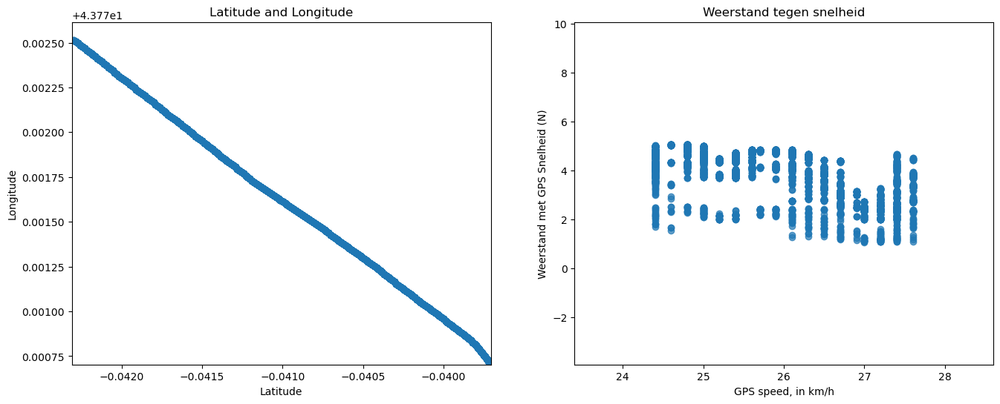

In [142]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Filter alles boven 20N weg
df_combined = df_combined[(df_combined['Weerstand (N)'] >= 0) & (df_combined['Weerstand (N)'] <= 20)]
df_combined = df_combined[(df_combined['Weerstand met GPS Snelheid (N)'] >= 0) & (df_combined['Weerstand met GPS Snelheid (N)'] <= 20)]
# Verwijder rijen met NaN of oneindige waarden in de relevante kolommen
df_combined = df_combined.replace([np.inf, -np.inf], np.nan)
df_combined = df_combined.dropna(subset=['Weerstand met GPS Snelheid (N)', 'Weerstand (N)'])

# Filter de DataFrame om alleen gegevens vanaf index 390500 op te nemen
animatie_rechtstuk = df_combined.loc[390300:]

# Bereid de figuur voor
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Instellingen voor de latitude-longitude plot
ax1.set_ylim(animatie_rechtstuk['GPS latitude, in graden'].min() - 0.00001, animatie_rechtstuk['GPS latitude, in graden'].max() + 0.0001)
ax1.set_xlim(animatie_rechtstuk['GPS longitude, in graden'].min() - 0.00001, animatie_rechtstuk['GPS longitude, in graden'].max() + 0.00001)
ax1.set_xlabel("Latitude")
ax1.set_ylabel("Longitude")
ax1.set_title("Latitude and Longitude")

# Instellingen voor de snelheid-weerstand plot
ax2.set_xlim(animatie_rechtstuk['GPS speed, in km/h'].min() - 1, animatie_rechtstuk['GPS speed, in km/h'].max() + 1)
ax2.set_ylim(animatie_rechtstuk['Weerstand met GPS Snelheid (N)'].min() - 5, animatie_rechtstuk['Weerstand met GPS Snelheid (N)'].max() + 5)
ax2.set_xlabel("GPS speed, in km/h")
ax2.set_ylabel("Weerstand met GPS Snelheid (N)")
ax2.set_title("Weerstand tegen snelheid")

# Initialiseer scatter plots
scat1 = ax1.scatter([], [], alpha=0.7)
scat2 = ax2.scatter([], [], alpha=0.7)

# Definieer de updatefunctie
def update(frame):
    end = frame + 1  # Toon één extra rij per frame
    if end > len(animatie_rechtstuk):  # Stop wanneer alle data is weergegeven
        return scat1, scat2

    # Haal het huidige datachunk op
    chunk = animatie_rechtstuk.iloc[:end]

    # Update de GPS-plot
    chunk_lon = chunk['GPS longitude, in graden']
    chunk_lat = chunk['GPS latitude, in graden']
    scat1.set_offsets(np.column_stack((chunk_lon, chunk_lat)))

    # Update de snelheid-weerstand plot
    scat2.set_offsets(np.column_stack((chunk['GPS speed, in km/h'],
                                       chunk['Weerstand met GPS Snelheid (N)'])))

    return scat1, scat2

# Stel de animatie in
frames_count = len(animatie_rechtstuk)
anim = FuncAnimation(fig, update, frames=frames_count, repeat=False, interval=50, blit=True)

# Sla op als MP4-bestand
output_path = "dynamic_lat_lon_weerstand_recht_stuk_iets_langer.html"
html_writer = HTMLWriter()
anim.save(output_path, writer=html_writer, dpi=80)

print(f"Animatie opgeslagen als {output_path}.")    


Animation saved as dynamic_lat_lon_weerstand5.html with dark mode


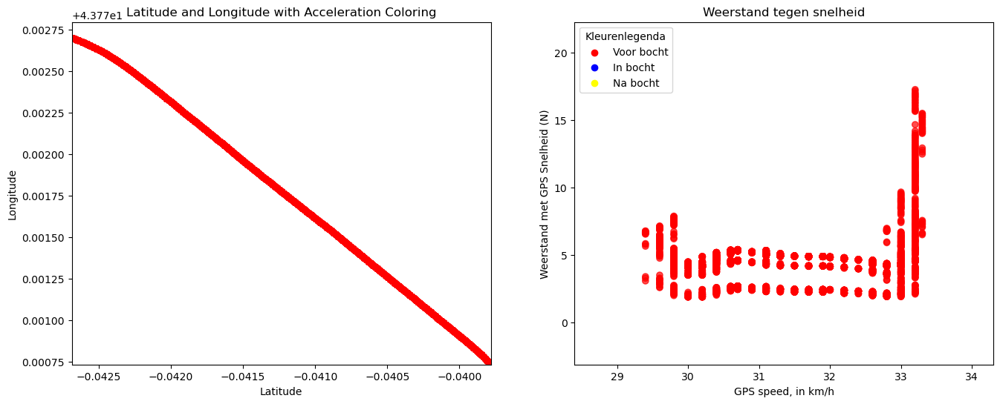

In [113]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

df_combined = df_meetstuk5
# Remove rows where acceleration, speed, or resistance is NaN or infinite
#df_combined = df_combined[(df_combined['Weerstand (N)'] >= 0) & (df_combined['Weerstand (N)'] <= 20)]
df_combined = df_combined[(df_combined['Weerstand met GPS Snelheid (N)'] >= 0) & (df_combined['Weerstand met GPS Snelheid (N)'] <= 20)]
df_combined = df_combined.replace([np.inf, -np.inf], np.nan)  # Replace inf/-inf with NaN
df_combined = df_combined.dropna(subset=['Weerstand met GPS Snelheid (N)'])  # Drop rows with NaN in these columns

# Prepare the figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Set up the latitude-longitude plot
ax1.set_ylim(df_combined['GPS latitude, in graden'].min() - 0.00001, df_combined['GPS latitude, in graden'].max() + 0.0001)
ax1.set_xlim(df_combined['GPS longitude, in graden'].min() - 0.00001, df_combined['GPS longitude, in graden'].max() + 0.00001)
ax1.set_xlabel("Latitude")
ax1.set_ylabel("Longitude")
ax1.set_title("Latitude and Longitude with Acceleration Coloring")

# Set up the speed comparison plot
ax2.set_xlim(df_combined['GPS speed, in km/h'].min() - 1, 
             df_combined['GPS speed, in km/h'].max() + 1)
ax2.set_ylim(df_combined['Weerstand met GPS Snelheid (N)'].min() - 5, 
             df_combined['Weerstand met GPS Snelheid (N)'].max() + 5)
ax2.set_xlabel("GPS speed, in km/h")
ax2.set_ylabel("Weerstand met GPS Snelheid (N)")
ax2.set_title("Weerstand tegen snelheid")

# Initialize scatter plots
scat1 = ax1.scatter([], [], alpha=0.7)
scat2 = ax2.scatter([], [], alpha=0.7)

# Add a legend for acceleration categories
legend_labels = [
    ('red', 'Voor bocht'),
    ('blue', 'In bocht'),
    ('yellow', 'Na bocht')
]
for color, label in legend_labels:
    ax2.scatter([], [], color=color, label=label)  # Dummy points for legend
ax2.legend(title="Kleurenlegenda", loc='upper left')

# Define the update function
def update(frame):
    end = frame + 1  # Display one additional row per frame
    if end > len(df_combined):  # Stop when all data is shown
        return

    # Extract data chunk
    chunk = df_combined.iloc[:end]  # Include all data up to the current frame
    
    # Determine colors for acceleration
    colors = chunk.index.map(
    lambda i: 'red' if i < 388565 else ('blue' if i <= 390150 else 'yellow'))

    # Update the latitude-longitude scatter plot
    # Update de GPS-plot
    chunk_lon = chunk['GPS longitude, in graden']
    chunk_lat = chunk['GPS latitude, in graden']
    scat1.set_offsets(np.column_stack((chunk_lon, chunk_lat)))
    scat1.set_color(colors)

    
    # Update the speed comparison plot
    scat2.set_offsets(np.column_stack((chunk['GPS speed, in km/h'],
                                        chunk['Weerstand met GPS Snelheid (N)'])))
    scat2.set_color(colors)

    return scat1, scat2

# Stel de animatie in
frames_count = len(df_combined)
anim = FuncAnimation(fig, update, frames=frames_count, repeat=False, interval=5, blit=True) #with 50ms per frame

# Custom dark mode CSS
dark_mode_css = """
<style>
    body {
        background-color: #121212;
        color: white;
    }
    .animation-container {
        background-color: #121212;
        border: 2px solid #ffffff;
        border-radius: 10px;
        padding: 20px;
    }   
</style>
"""

# Save as an HTML file
output_path = "dynamic_lat_lon_weerstand5.html"
from matplotlib.animation import HTMLWriter
html_writer = HTMLWriter()
anim.save(output_path, writer=html_writer, dpi=80)

# Append the dark mode CSS to the HTML
with open(output_path, 'a') as f:
    f.write(dark_mode_css)

print(f"Animation saved as {output_path} with dark mode")